## **Crawling the Data from Wikipedia API**


In [ ]:
!pip install wikipedia-api

In [ ]:
import wikipediaapi
wiki_wiki = wikipediaapi.Wikipedia('en', extract_format=wikipediaapi.ExtractFormat.WIKI, headers={'User-Agent': 'Your-User-Agent-Here'})

category_title = "Category:Parkinson's disease"


category = wiki_wiki.page(category_title)

if category.exists() and category.ns == wikipediaapi.Namespace.CATEGORY:
    total_articles = len(category.categorymembers)
    print(f"Total number of articles in the category '{category_title}': {total_articles}")

    print("\nTitles of the fetched articles:")
    for index, member_title in enumerate(category.categorymembers, start=0):
        print(f"{index}. {member_title}")
else:
    print(f"Error: Category '{category_title}' does not exist.")

Total number of articles in the category 'Category:Parkinson's disease': 58

Titles of the fetched articles:
0. Parkinson's disease
1. Animal models of Parkinson's disease
2. Braak staging
3. Bradyphrenia
4. Buntanetap
5. Catalepsy
6. Causes of Parkinson's disease
7. Cell-based therapies for Parkinson's disease
8. Cloudy Times
9. Contursi Terme
10. Diane G. Cook
11. DaT scan
12. Deep brain stimulation
13. ΔFosB
14. Dietary management of Parkinson's disease
15. Dopamine dysregulation syndrome
16. Dyskinesia
17. Early-onset parkinsonism-intellectual disability syndrome
18. Fox Trial Finder
19. Frontal Assessment Battery
20. Gene therapy in Parkinson's disease
21. Glucocerebrosidase
22. Gut–brain axis
23. History of Parkinson's disease
24. Hoehn and Yahr scale
25. Hypomimia
26. Hypophonia
27. Kinesia paradoxa
28. Lee Silverman voice treatment
29. Levodopa-induced dyskinesia
30. Lewy body
31. Liftware
32. LRRK2
33. Management of Parkinson's disease
34. Micrographia (handwriting)
35. Minzas

In [ ]:
all_documents = []

if category.exists() and category.ns == wikipediaapi.Namespace.CATEGORY:
    for member_title in category.categorymembers:
        member_page = wiki_wiki.page(member_title)
        if member_page.exists():
            all_documents.append(member_page.text)
            print(f"Fetched content for article: {member_title}")
        else:
            print(f"Error: Page for '{member_title}' does not exist.")
else:
    print(f"Error: Category '{category_title}' does not exist.")

print(all_documents)

Fetched content for article: Parkinson's disease
Fetched content for article: Animal models of Parkinson's disease
Fetched content for article: Braak staging
Fetched content for article: Bradyphrenia
Fetched content for article: Buntanetap
Fetched content for article: Catalepsy
Fetched content for article: Causes of Parkinson's disease
Fetched content for article: Cell-based therapies for Parkinson's disease
Fetched content for article: Cloudy Times
Fetched content for article: Contursi Terme
Fetched content for article: Diane G. Cook
Fetched content for article: DaT scan
Fetched content for article: Deep brain stimulation
Fetched content for article: ΔFosB
Fetched content for article: Dietary management of Parkinson's disease
Fetched content for article: Dopamine dysregulation syndrome
Fetched content for article: Dyskinesia
Fetched content for article: Early-onset parkinsonism-intellectual disability syndrome
Fetched content for article: Fox Trial Finder
Fetched content for article: 

In [ ]:
import requests

def get_autocomplete_queries(query):
    base_url = "https://suggestqueries.google.com/complete/search"
    params = {
        "q": query,
        "client": "chrome"
    }

    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        data = response.json()
        suggestions = data[1]
        return suggestions
    else:
        print(f"Error: {response.status_code}")
        return None

queries = get_autocomplete_queries("Parkinson's disease")
all_queries = []

print("The fetched queries:")

if queries:
    for i, query in enumerate(queries, start=1):
        print(f"{i}. {query}")
        all_queries.append(query)
else:
    print("No autocomplete suggestions.")

The fetched queries:
1. parkinson's disease symptoms
2. parkinson's disease stages
3. parkinson's disease icd 10
4. parkinson's disease cause
5. parkinson's disease early symptoms
6. parkinson's disease treatment
7. parkinson's disease medication
8. parkinson's disease age
9. parkinson's disease diagnosis
10. parkinson's disease definition
11. parkinson's disease prognosis
12. parkinson's disease dementia
13. parkinson's disease pathophysiology
14. parkinson's disease genetic
15. parkinson's disease progression


# **Modeling and Visualization of the fetched documents**

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
#document modeling using LDA
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string

# Preprocess
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([word for word in doc.lower().split() if word not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in all_documents]


dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]


ldamodel = LdaModel(doc_term_matrix, num_topics=58, id2word = dictionary, passes=50)


print(ldamodel.print_topics(num_topics=58, num_words=5))

[(0, '0.000*"disease" + 0.000*"body" + 0.000*"pd" + 0.000*"parkinson" + 0.000*"gait"'), (1, '0.000*"δfosb" + 0.000*"patient" + 0.000*"disease" + 0.000*"pd" + 0.000*"gait"'), (2, '0.000*"disease" + 0.000*"cell" + 0.000*"motor" + 0.000*"parkinson" + 0.000*"pd"'), (3, '0.000*"pd" + 0.000*"disease" + 0.000*"symptom" + 0.000*"parkinson" + 0.000*"motor"'), (4, '0.027*"behavior" + 0.023*"rbd" + 0.023*"sleep" + 0.019*"rem" + 0.019*"screen"'), (5, '0.022*"stage" + 0.022*"disease" + 0.013*"parkinson" + 0.013*"scale" + 0.013*"yahr"'), (6, '0.019*"tremor" + 0.019*"spoon" + 0.010*"essential" + 0.010*"medical" + 0.010*"product"'), (7, '0.000*"patient" + 0.000*"disease" + 0.000*"task" + 0.000*"parkinson" + 0.000*"pd"'), (8, '0.041*"δfosb" + 0.019*"drug" + 0.017*"addiction" + 0.017*"expression" + 0.014*"nucleus"'), (9, '0.018*"drug" + 0.018*"tremorine" + 0.012*"also" + 0.012*"used" + 0.012*"tremor"'), (10, '0.035*"dopamine" + 0.022*"symptom" + 0.017*"medication" + 0.016*"dd" + 0.014*"behavioral"'), (1

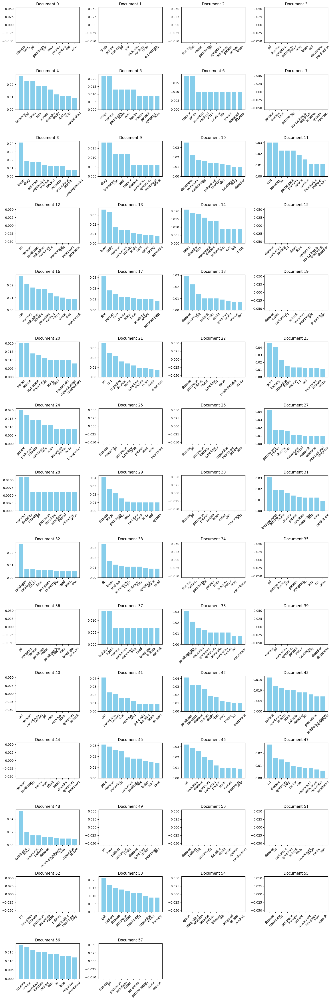

In [ ]:
#graph representation
import matplotlib.pyplot as plt

num_topics = ldamodel.num_topics

cols = 4
rows = num_topics // cols + (num_topics % cols > 0)
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()

for topic_id in range(num_topics):
    ax = axes[topic_id]
    df = topic_to_df(ldamodel, topic_id)
    ax.bar(df['Term'], df['Weight'], color='skyblue')
    ax.set_title(f'Document {topic_id}')
    ax.tick_params(axis='x', rotation=45)

for i in range(num_topics, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
!pip install wordcloud matplotlib

<ipython-input-10-ea94f1facd4d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 6), facecolor=None)


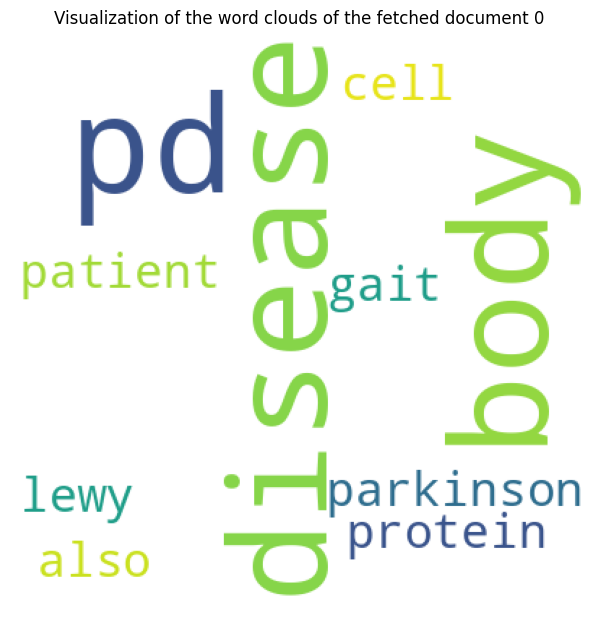

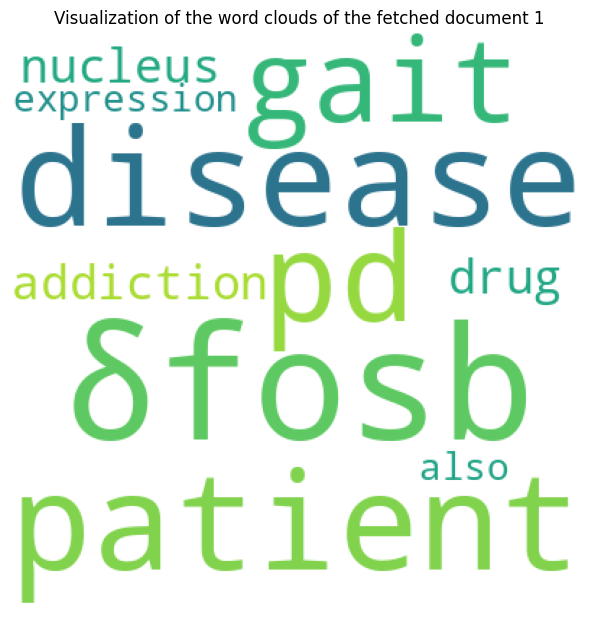

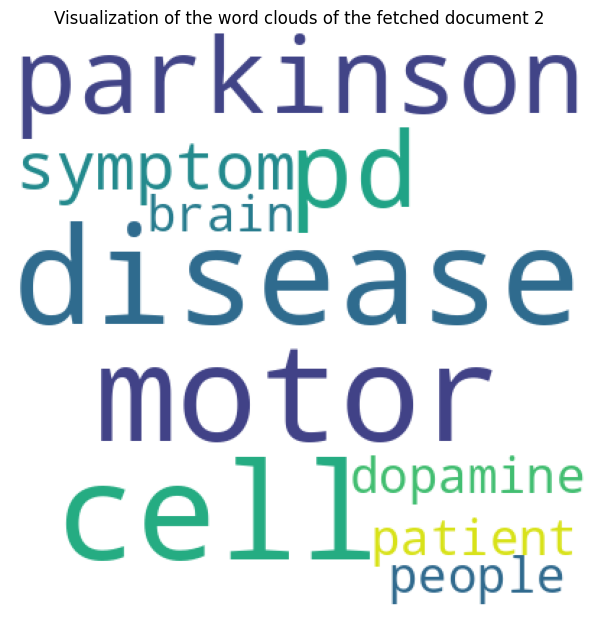

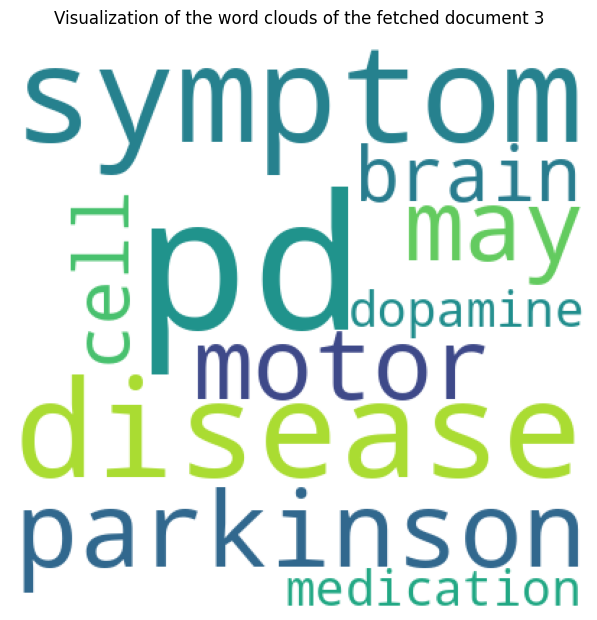

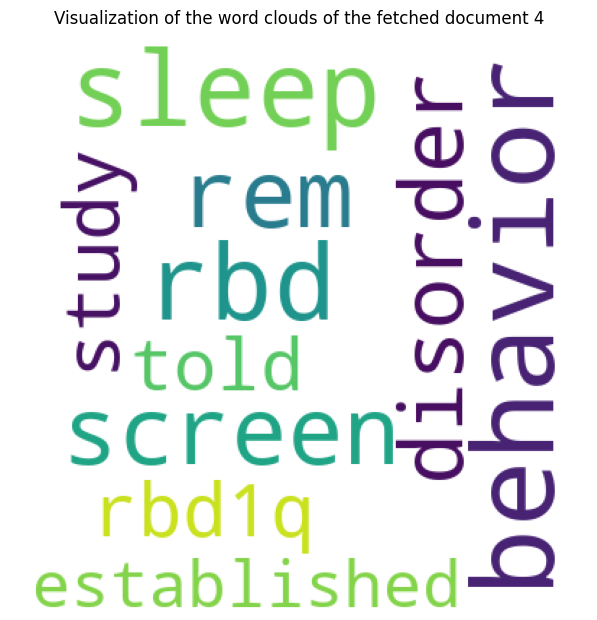

...

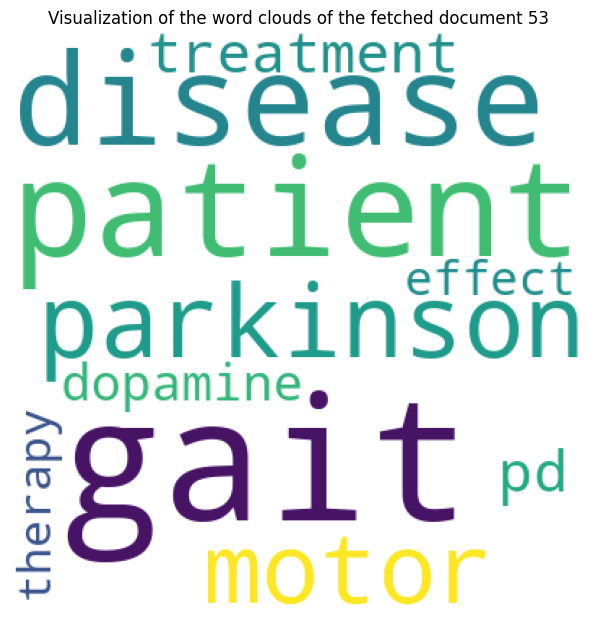

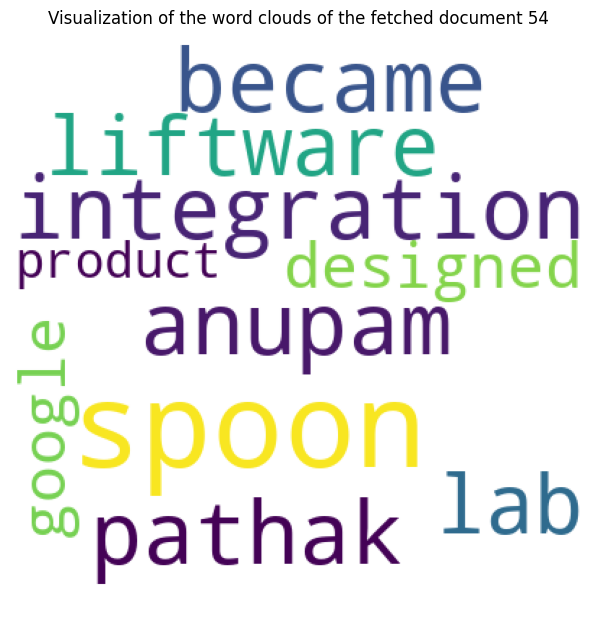

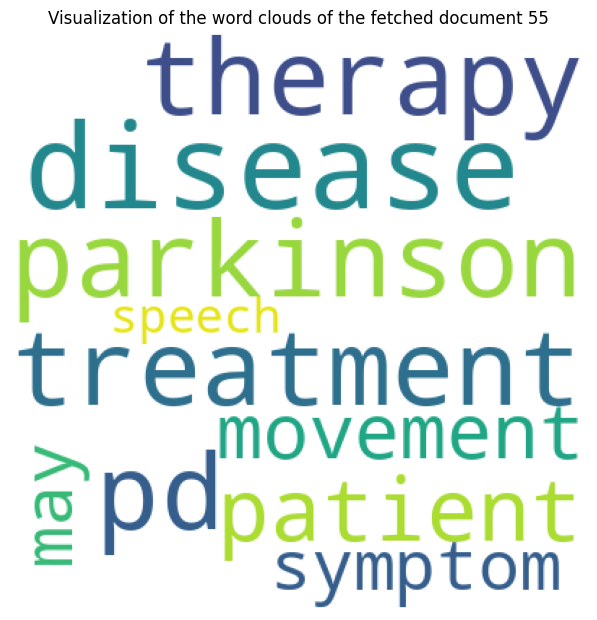

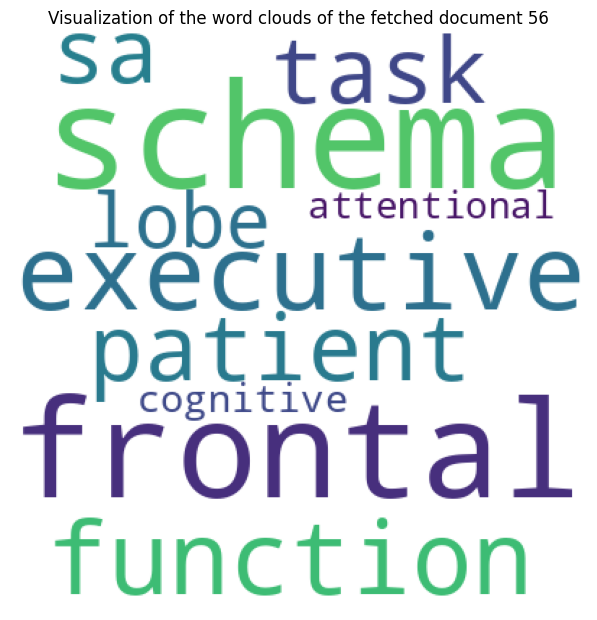

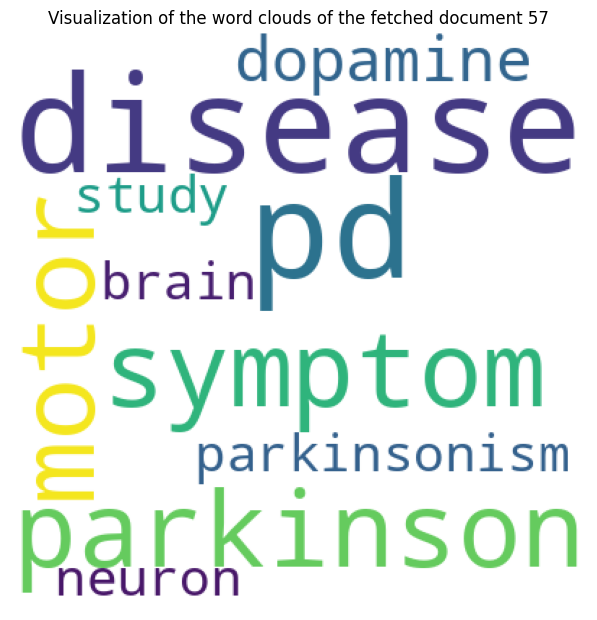

In [ ]:
#word cloud representation
from wordcloud import WordCloud
import matplotlib.pyplot as plt

num_top_words = 10

num_topics = ldamodel.num_topics

for topic_number in range(num_topics):
    top_words = ldamodel.show_topic(topic_number, num_top_words)
    topic_words = {word: weight for word, weight in top_words}

    wordcloud = WordCloud(width=400, height=400, background_color='white').generate_from_frequencies(topic_words)


    plt.figure(figsize=(6, 6), facecolor=None)
    plt.imshow(wordcloud)
    plt.title(f"Visualization of the word clouds of the fetched document {topic_number}")
    plt.axis("off")
    plt.tight_layout(pad=0)

plt.show()

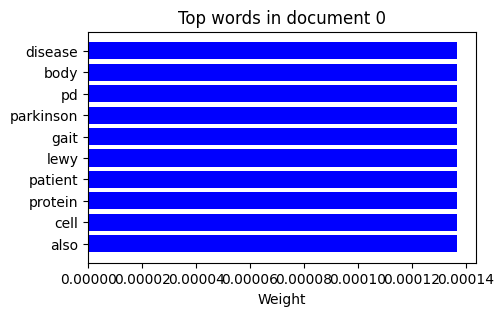

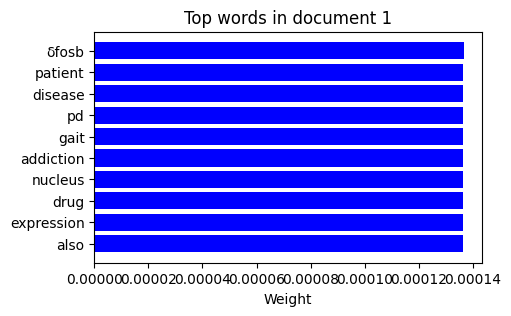

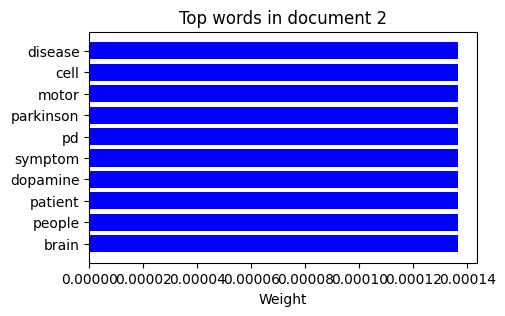

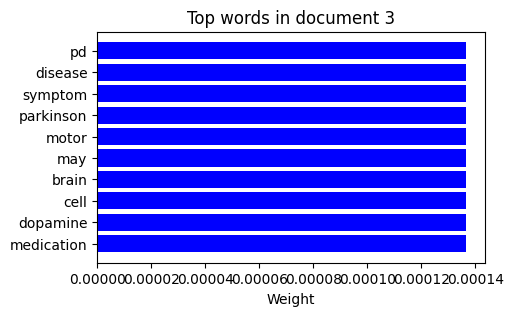

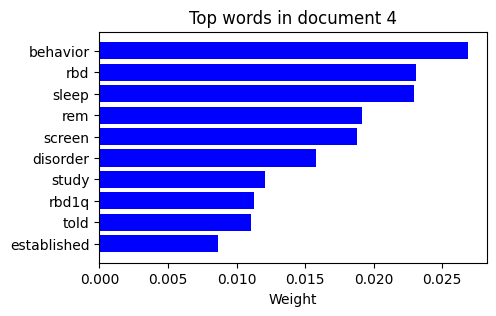

...

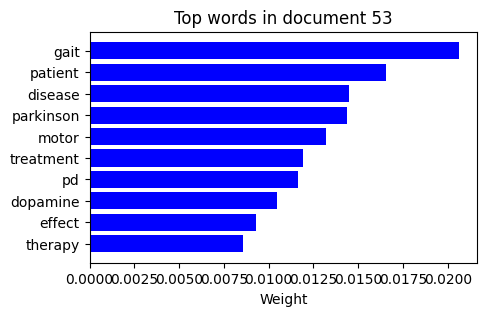

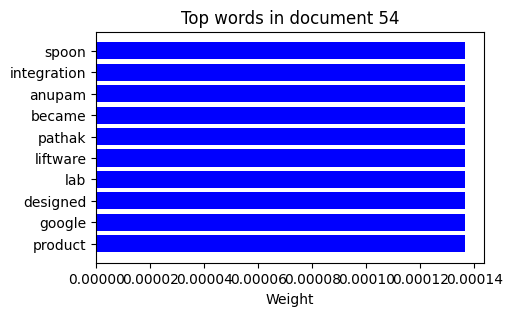

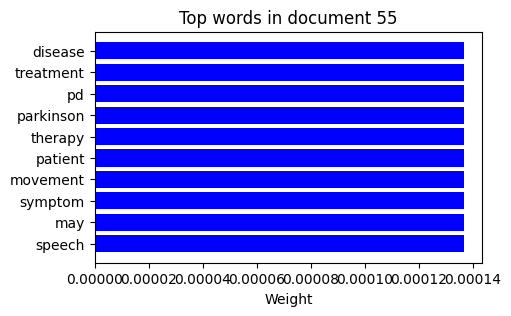

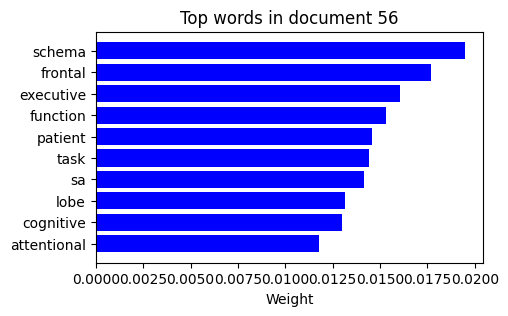

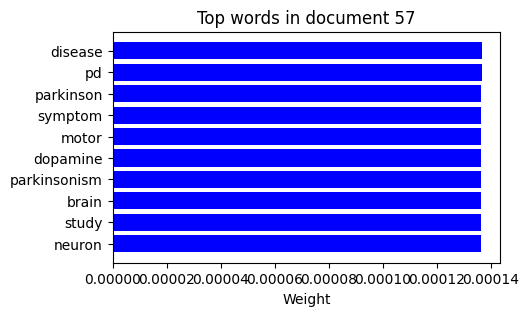

In [ ]:
#Top words visualization
import matplotlib.pyplot as plt

num_top_words = 10

num_topics = ldamodel.num_topics

for topic_number in range(num_topics):
    top_words = ldamodel.show_topic(topic_number, num_top_words)
    words = []
    weights = []

    for word, weight in top_words:
        words.append(word)
        weights.append(weight)

    plt.figure(figsize=(5, 3))
    plt.barh(words, weights, color='blue')
    plt.gca().invert_yaxis()
    plt.xlabel('Weight')
    plt.title(f'Top words in document {topic_number}')
    plt.show()

# **Baseline ranking of documents using LDA model for query = "Parkinson Disease"**

In [ ]:
#Baseline ranking using LDA model for query = "Parkinson Disease"
query = "Parkinson's Disease"
query_clean = clean(query)
query_bow = dictionary.doc2bow(query_clean.split())
query_lda = ldamodel[query_bow]
print("Preprocessed Query:",query_clean)

Preprocessed Query: parkinson disease


In [ ]:
#Similarities Calculation for LDA
from gensim.matutils import sparse2full
from scipy.spatial.distance import jensenshannon

def get_similarity(doc_lda, query_lda):
    # Convert to dense vectors if they are not already
    doc_dense = sparse2full(doc_lda, num_topics)
    query_dense = sparse2full(query_lda, num_topics)
    return jensenshannon(doc_dense, query_dense)

similarities_LDA = [get_similarity(ldamodel[doc], query_lda) for doc in doc_term_matrix]

print(similarities_LDA)

[0.7988196934485882, 0.8016913475895363, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.640317750148743, 0.8325546123015592, 0.8325546123015592, 0.0, 0.0, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.6655101256126871, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.8325546123015592, 0.83255461

In [ ]:
# Rank Documents
ranked_docs_LDA = sorted(enumerate(similarities_LDA), key=lambda x: x[1])
print(ranked_docs_LDA)

[(39, 0.0), (40, 0.0), (36, 0.640317750148743), (44, 0.6655101256126871), (0, 0.7988196934485882), (1, 0.8016913475895363), (55, 0.8058838330697913), (57, 0.8058838330697913), (2, 0.8325546123015592), (3, 0.8325546123015592), (4, 0.8325546123015592), (5, 0.8325546123015592), (6, 0.8325546123015592), (7, 0.8325546123015592), (8, 0.8325546123015592), (9, 0.8325546123015592), (10, 0.8325546123015592), (11, 0.8325546123015592), (12, 0.8325546123015592), (13, 0.8325546123015592), (14, 0.8325546123015592), (15, 0.8325546123015592), (16, 0.8325546123015592), (17, 0.8325546123015592), (18, 0.8325546123015592), (19, 0.8325546123015592), (20, 0.8325546123015592), (21, 0.8325546123015592), (22, 0.8325546123015592), (23, 0.8325546123015592), (24, 0.8325546123015592), (25, 0.8325546123015592), (26, 0.8325546123015592), (27, 0.8325546123015592), (28, 0.8325546123015592), (29, 0.8325546123015592), (30, 0.8325546123015592), (31, 0.8325546123015592), (32, 0.8325546123015592), (33, 0.8325546123015592), 

In [ ]:
title_line = []
for doc in all_documents:
    first_line = doc.split('\n', 1)[0]
    # Assuming the title ends at the first period (end of the first sentence)
    title = first_line.split('.', 1)[0]
    title_line.append(title)
print(title_line)

["Parkinson's disease (PD), or simply Parkinson's, is a chronic degenerative disorder of the central nervous system that affects both the motor system and non-motor systems", "Animal models of Parkinson's disease are essential in the research field and widely used to study Parkinson's disease", "Braak staging refers to two methods used to classify the degree of pathology in Parkinson's disease and Alzheimer's disease", 'Bradyphrenia is the slowness of thought common to many disorders of the brain', "Buntanetap is an orally-administered small molecule inhibitor of several neurotoxic proteins that is under investigation in the treatment of Alzheimer's disease, frontotemporal dementia, chronic traumatic encephalopathy and Parkinson's disease", 'Catalepsy (from Ancient Greek katálēpsis, κατάληψις, "seizing, grasping") is a nervous condition characterized by muscular rigidity and fixity of posture regardless of external stimuli, as well as decreased sensitivity to pain', "Parkinson's diseas

In [ ]:
doc_titles = []
doc_IDS = []
for index, member_title in enumerate(category.categorymembers, start=0):
    doc_titles.append(member_title)
    doc_IDS.append(index)
    print(f"{index}. {member_title}")

0. Parkinson's disease
1. Animal models of Parkinson's disease
2. Braak staging
3. Bradyphrenia
4. Buntanetap
5. Catalepsy
6. Causes of Parkinson's disease
7. Cell-based therapies for Parkinson's disease
8. Cloudy Times
9. Contursi Terme
10. Diane G. Cook
11. DaT scan
12. Deep brain stimulation
13. ΔFosB
14. Dietary management of Parkinson's disease
15. Dopamine dysregulation syndrome
16. Dyskinesia
17. Early-onset parkinsonism-intellectual disability syndrome
18. Fox Trial Finder
19. Frontal Assessment Battery
20. Gene therapy in Parkinson's disease
21. Glucocerebrosidase
22. Gut–brain axis
23. History of Parkinson's disease
24. Hoehn and Yahr scale
25. Hypomimia
26. Hypophonia
27. Kinesia paradoxa
28. Lee Silverman voice treatment
29. Levodopa-induced dyskinesia
30. Lewy body
31. Liftware
32. LRRK2
33. Management of Parkinson's disease
34. Micrographia (handwriting)
35. Minzasolmin
36. MultiPark
37. Palilalia
38. Parkinson-plus syndrome
39. Parkinson's Disease (journal)
40. Parkinson

In [ ]:
print(len(doc_titles))
print(len(doc_IDS))

58
58


In [ ]:
ranked_results_LDA = [(40, 0.20782537026096448), (18, 0.4853536195154945), (55, 0.8058838330697913), (57, 0.8058838330697913), (0, 0.8325546123015592)]

top_5 = ranked_results_LDA[:5]

print("Top 5 documents for LDA Model:")
for index, score in top_5:
    title = doc_titles[index]
    id = doc_IDS[index]
    print(f"Document {id}: {title}, \nScore: {score}")

Top 5 documents for LDA Model:
Document 40: Parkinson's disease clinical research, 
Score: 0.20782537026096448
Document 18: Fox Trial Finder, 
Score: 0.4853536195154945
Document 55: Category:Parkinson's disease organizations, 
Score: 0.8058838330697913
Document 57: Category:Parkinson's disease researchers, 
Score: 0.8058838330697913
Document 0: Parkinson's disease, 
Score: 0.8325546123015592


In [ ]:
import pandas as pd

ranked_results_LDA = [(40, 0.20782537026096448), (18, 0.4853536195154945), (55, 0.8058838330697913), (57, 0.8058838330697913), (0, 0.8325546123015592)]
top_5 = ranked_results_LDA[:5]

df = pd.DataFrame([{'ID': doc_IDS[index], 'Title': doc_titles[index], 'Score': score} for index, score in top_5])

df.sort_values(by='Score', ascending=False, inplace=True)

df.set_index('ID', inplace=True)

print("Top 5 Documents for LDA Model:")
print(df)

Top 5 Documents for LDA Model:
                                         Title     Score
ID                                                      
0                          Parkinson's disease  0.832555
55  Category:Parkinson's disease organizations  0.805884
57    Category:Parkinson's disease researchers  0.805884
18                            Fox Trial Finder  0.485354
40       Parkinson's disease clinical research  0.207825


## **TF-IDF Vectorization and Ranking of pages using Cosine similarity Scores**

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer()
tfidf_document_vectors = tfidf_vectorizer.fit_transform(all_documents)
tfidf_query_vectors = tfidf_vectorizer.transform(all_queries)
print("Vector form of all the documents:\n", tfidf_document_vectors)
print("-----------------------------------------------------")
print("Vector form of all the queries:\n", tfidf_query_vectors)

Vector form of all the documents:
   (0, 1739)	0.0037810396106789804
  (0, 3899)	0.0015690615390583917
  (0, 2589)	0.0015365147842185828
  (0, 161)	0.0037810396106789804
  (0, 210)	0.0037810396106789804
  (0, 5081)	0.0037810396106789804
  (0, 40)	0.0037810396106789804
  (0, 900)	0.0037810396106789804
  (0, 22)	0.0037810396106789804
  (0, 77)	0.0037810396106789804
  (0, 73)	0.0037810396106789804
  (0, 238)	0.0037810396106789804
  (0, 4988)	0.0037810396106789804
  (0, 1080)	0.003183278738970531
  (0, 1455)	0.002833611044622698
  (0, 146)	0.003183278738970531
  (0, 3754)	0.0037810396106789804
  (0, 4401)	0.0037810396106789804
  (0, 3068)	0.0037810396106789804
  (0, 6934)	0.0037810396106789804
  (0, 1218)	0.0037810396106789804
  (0, 983)	0.0037810396106789804
  (0, 731)	0.003183278738970531
  (0, 3707)	0.00540134711396654
  (0, 23)	0.0037810396106789804
  :	:
  (54, 702)	0.09759789961861275
  (54, 2063)	0.07806382566961288
  (54, 4842)	0.07939946140170259
  (56, 1992)	0.293090321991814
  (

In [ ]:
#cosine similarity measurement
cosine_similarities0 = cosine_similarity(tfidf_query_vectors, tfidf_document_vectors)
cosine_similarities = cosine_similarity(tfidf_query_vectors, tfidf_document_vectors).flatten()

print("Shape of Cosine Similarity before flatten:",cosine_similarities0.shape)
print("Shape of Cosine Similarity after flatten::",cosine_similarities.shape)

ranked_documents = sorted(zip(range(len(all_documents)), cosine_similarities), key=lambda x: x[1], reverse=True)
num_ranked_docs = len(ranked_documents)
print("Total ranked documents:", num_ranked_docs)

for idx, similarity in ranked_documents:
    print(f"Document {idx}: Similarity = {similarity:.4f}")

Shape of Cosine Similarity before flatten: (15, 58)
Shape of Cosine Similarity after flatten:: (870,)
Total ranked documents: 58
Document 40: Similarity = 0.2067
Document 0: Similarity = 0.1759
Document 42: Similarity = 0.1535
Document 10: Similarity = 0.1513
Document 48: Similarity = 0.1387
Document 33: Similarity = 0.1386
Document 14: Similarity = 0.1371
Document 24: Similarity = 0.1340
Document 34: Similarity = 0.1326
Document 32: Similarity = 0.1312
Document 53: Similarity = 0.1298
Document 15: Similarity = 0.1185
Document 56: Similarity = 0.1180
Document 38: Similarity = 0.1130
Document 23: Similarity = 0.1123
Document 2: Similarity = 0.1111
Document 6: Similarity = 0.1063
Document 39: Similarity = 0.1056
Document 43: Similarity = 0.1043
Document 3: Similarity = 0.1006
Document 17: Similarity = 0.0849
Document 29: Similarity = 0.0825
Document 7: Similarity = 0.0785
Document 35: Similarity = 0.0753
Document 54: Similarity = 0.0752
Document 28: Similarity = 0.0713
Document 11: Simil

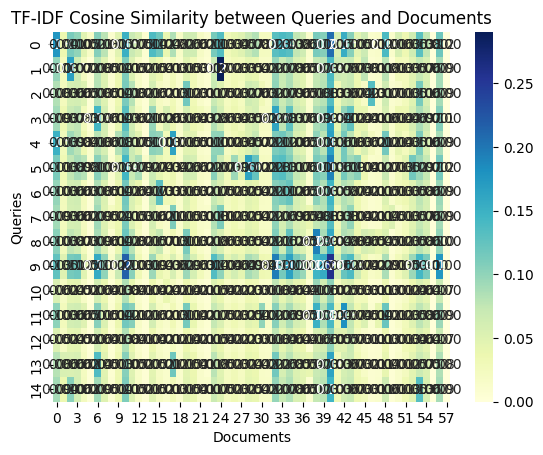

In [ ]:
#Heatmap plotting for Cosine Similarities
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(cosine_similarities0, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("TF-IDF Cosine Similarity between Queries and Documents")
plt.xlabel("Documents")
plt.ylabel("Queries")
plt.show()

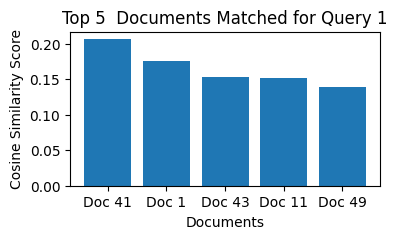

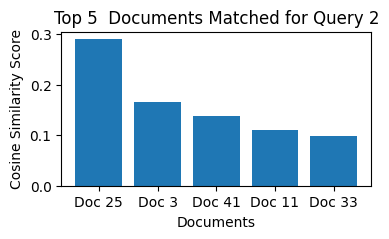

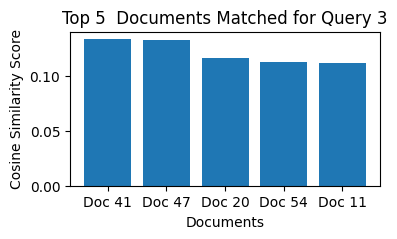

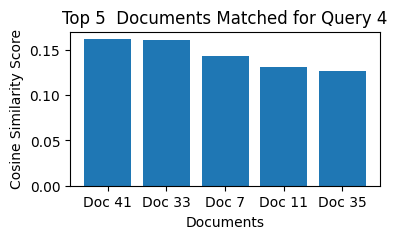

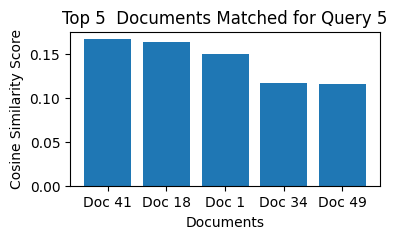

...

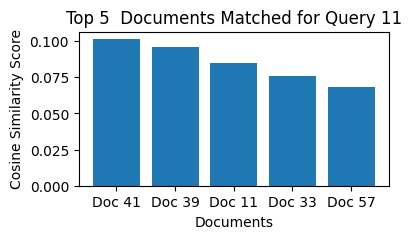

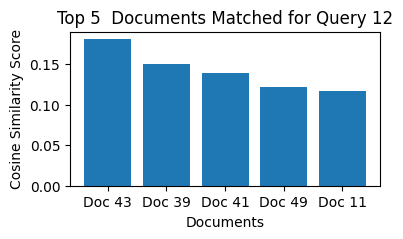

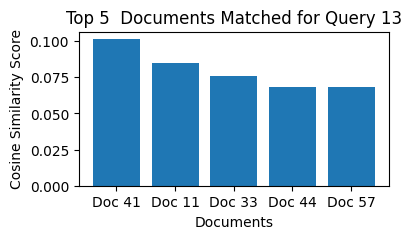

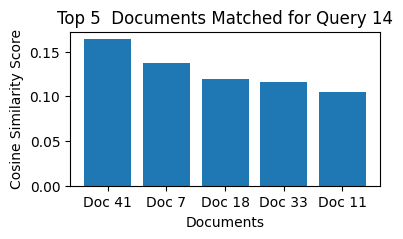

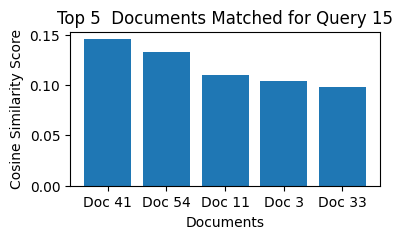

In [ ]:
import matplotlib.pyplot as plt

#ranking based on individual queries
ranked_documents_per_query = []
for query_similarities in cosine_similarities0:
    ranked_docs_for_query = sorted(enumerate(query_similarities), key=lambda x: x[1], reverse=True)
    ranked_documents_per_query.append(ranked_docs_for_query)

for i, ranked_docs_for_query in enumerate(ranked_documents_per_query):
    # top 5 documents for each query
    doc_indices, scores = zip(*ranked_docs_for_query[:5])

    plt.figure(figsize=(4, 2))
    plt.bar(range(len(doc_indices)), scores, tick_label=[f"Doc {idx+1}" for idx in doc_indices])
    plt.title(f"Top 5  Documents Matched for Query {i+1}")
    plt.xlabel("Documents")
    plt.ylabel("Cosine Similarity Score")
    plt.show()

In [ ]:
#top 5 ranking of Documents based on COSINE similarities
import pandas as pd

data = [
    {"ID": 40, "Similarity": 0.2067},
    {"ID": 0, "Similarity": 0.1759},
    {"ID": 42, "Similarity": 0.1535},
    {"ID": 10, "Similarity": 0.1513},
    {"ID": 14, "Similarity": 0.1387}
]

# Create DataFrame
df = pd.DataFrame(data)

# Sort the DataFrame by 'Similarity' in descending order
df.sort_values(by='Similarity', ascending=False, inplace=True)

# Set the ID as the index
df.set_index('ID', inplace=True)

# Display the DataFrame
print("Ranked Documents by Similarity:")
print(df)

Ranked Documents by Similarity:
    Similarity
ID            
40      0.2067
0       0.1759
42      0.1535
10      0.1513
14      0.1387


In [ ]:
import pandas as pd

ranked_results_CS = [(40, 0.20782537026096448), (0, 0.1759), (42, 0.1535), (10, 0.1513), (0, 0.1387)]
top_5 = ranked_results_CS[:5]

df = pd.DataFrame([{'ID': doc_IDS[index], 'Title': doc_titles[index], 'Score': score} for index, score in top_5])

df.sort_values(by='Score', ascending=False, inplace=True)

df.set_index('ID', inplace=True)

print("Top 5 Documents for Cosine Similarity Model:")
print(df)

Top 5 Documents for Cosine Similarity Model:
                                    Title     Score
ID                                                 
40  Parkinson's disease clinical research  0.207825
0                     Parkinson's disease  0.175900
42                           Parkinsonism  0.153500
10                          Diane G. Cook  0.151300
0                     Parkinson's disease  0.138700


# **Set representation of the documents and queries and Ranking Based on Jaccard Similarity**

In [ ]:
# Preprocess for jaccard
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()

def clean(doc):
    stop_free = " ".join([word for word in doc.lower().split() if word not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in all_documents]
query_clean = [clean(doc).split() for doc in all_queries]

print("Cleaned Document:",doc_clean)
print("Cleaned Query:",query_clean)

Cleaned Document: [['parkinson', 'disease', 'pd', 'simply', 'parkinson', 'chronic', 'degenerative', 'disorder', 'central', 'nervous', 'system', 'affect', 'motor', 'system', 'nonmotor', 'system', 'symptom', 'usually', 'emerge', 'slowly', 'disease', 'progress', 'nonmotor', 'symptom', 'become', 'common', 'early', 'symptom', 'tremor', 'rigidity', 'slowness', 'movement', 'difficulty', 'walking', 'problem', 'may', 'also', 'arise', 'cognition', 'behaviour', 'sleep', 'sensory', 'system', 'parkinson', 'disease', 'dementia', 'common', 'advanced', 'stage', 'motor', 'symptom', 'disease', 'result', 'nerve', 'cell', 'death', 'substantia', 'nigra', 'midbrain', 'region', 'supply', 'dopamine', 'basal', 'ganglion', 'cause', 'cell', 'death', 'poorly', 'understood', 'involves', 'aggregation', 'protein', 'alphasynuclein', 'lewy', 'body', 'within', 'neuron', 'collectively', 'main', 'motor', 'symptom', 'known', 'parkinsonism', 'contributing', 'factor', 'include', 'combination', 'genetic', 'environmental', 'f

In [ ]:
# Jaccard Similarity
def jaccard_similarity(set1, set2):
    intersection = set1.intersection(set2)
    union = set1.union(set2)
    return len(intersection) / len(union) if len(union) != 0 else 0

# Convertion of lists of words to sets
doc_sets = [set(doc) for doc in doc_clean]
query_sets = [set(query) for query in query_clean]
print("Jaccard Similarity for all the doc-queries:")

for i, query_set in enumerate(query_sets):
    similarities = [jaccard_similarity(query_set, doc_set) for doc_set in doc_sets]
    ranked_docs = sorted(range(len(similarities)), key=lambda idx: similarities[idx], reverse=True)

    print(f"Top matching documents for Query {i+1}:")
    for idx in ranked_docs[:5]:  # Adjust number as needed
        print(f"Document {idx+1} (Jaccard Score: {similarities[idx]:.3f})")
    print("\n")

Jaccard Similarity for all the doc-queries:
Top matching documents for Query 1:
Document 57 (Jaccard Score: 0.167)
Document 55 (Jaccard Score: 0.125)
Document 36 (Jaccard Score: 0.118)
Document 53 (Jaccard Score: 0.094)
Document 40 (Jaccard Score: 0.077)


Top matching documents for Query 2:
Document 57 (Jaccard Score: 0.167)
Document 55 (Jaccard Score: 0.125)
Document 36 (Jaccard Score: 0.118)
Document 40 (Jaccard Score: 0.077)
Document 45 (Jaccard Score: 0.067)


Top matching documents for Query 3:
Document 57 (Jaccard Score: 0.154)
Document 55 (Jaccard Score: 0.118)
Document 36 (Jaccard Score: 0.111)
Document 40 (Jaccard Score: 0.074)
Document 45 (Jaccard Score: 0.065)


Top matching documents for Query 4:
Document 57 (Jaccard Score: 0.273)
Document 55 (Jaccard Score: 0.125)
Document 36 (Jaccard Score: 0.118)
Document 40 (Jaccard Score: 0.077)
Document 26 (Jaccard Score: 0.067)


Top matching documents for Query 5:
Document 57 (Jaccard Score: 0.154)
Document 55 (Jaccard Score: 0.118

In [ ]:
ranked_docs_jc = []

for query_set in query_sets:
    similarities_jc = [(doc_index, jaccard_similarity(query_set, doc_sets[doc_index])) for doc_index in range(len(doc_sets))]
    # Sort by similarity scores
    ranked_docs_for_query = sorted(similarities_jc, key=lambda x: x[1], reverse=True)
    ranked_docs.append(ranked_docs_for_query)
print("Ranked docs based on JC sim:",ranked_docs, similarities_jc)

Ranked docs based on JC sim: [56, 54, 35, 39, 44, 52, 26, 25, 19, 36, 17, 24, 31, 18, 47, 34, 53, 4, 2, 11, 38, 46, 7, 32, 28, 8, 20, 45, 16, 6, 9, 29, 37, 30, 15, 21, 51, 42, 10, 1, 14, 50, 43, 40, 23, 13, 3, 48, 5, 22, 27, 41, 49, 12, 33, 0, 55, 57, [(56, 0.16666666666666666), (54, 0.125), (35, 0.11764705882352941), (52, 0.09375), (39, 0.07692307692307693), (44, 0.06666666666666667), (17, 0.057692307692307696), (26, 0.05128205128205128), (24, 0.04477611940298507), (25, 0.043478260869565216), (19, 0.0392156862745098), (36, 0.038461538461538464), (31, 0.028985507246376812), (34, 0.02727272727272727), (18, 0.022222222222222223), (4, 0.022058823529411766), (47, 0.02127659574468085), (38, 0.0189873417721519), (53, 0.015544041450777202), (7, 0.015384615384615385), (28, 0.014354066985645933), (2, 0.013636363636363636), (11, 0.01282051282051282), (46, 0.0125), (16, 0.011627906976744186), (29, 0.01098901098901099), (15, 0.010033444816053512), (32, 0.009852216748768473), (42, 0.008982035928143

In [ ]:
for i, ranked_docs_for_query in enumerate(ranked_docs_jc):
    print(f"Ranked documents for Query {i+1}:")
    for doc in ranked_docs_for_query:
        print(f"  Doc Index: {doc[0]}, Similarity Score: {doc[1]}")
    print()


In [ ]:
print("Jaccard Similarities:")
for query_set in query_sets:
    similarities_jc = [(doc_index, jaccard_similarity(query_set, doc_sets[doc_index])) for doc_index in range(len(doc_sets))]
    print(f"{similarities_jc[:5]}")  # to print first 5 similarities
    ranked_docs_for_query = sorted(similarities_jc, key=lambda x: x[1], reverse=True)
    ranked_docs_jc.append(ranked_docs_for_query)

# first few docs with JC scores
print("First few ranked documents for the first query:", ranked_docs_jc[0][:5])

Jaccard Similarities:
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.013636363636363636), (3, 0.006263048016701462), (4, 0.022058823529411766)]
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.013636363636363636), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.001310615989515072), (1, 0.003656307129798903), (2, 0.009009009009009009), (3, 0.004158004158004158), (4, 0.021897810218978103)]
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.0017482517482517483), (1, 0.005494505494505495), (2, 0.01818181818181818), (3, 0.008350730688935281), (4, 0.021897810218978103)]
[(0, 0.0013111888111888112), (1, 0.003663003663003663), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.022058823529411766)]
[(0, 0.0013111888111888112), (1, 0.003663003663003663), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.00131118881118881

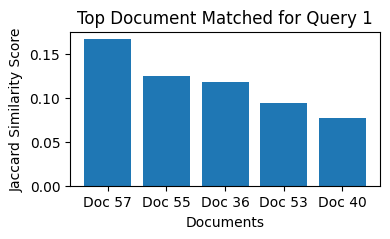

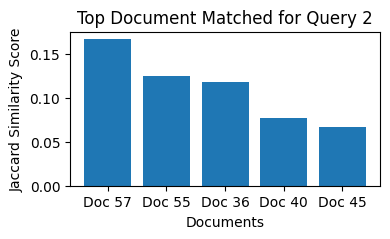

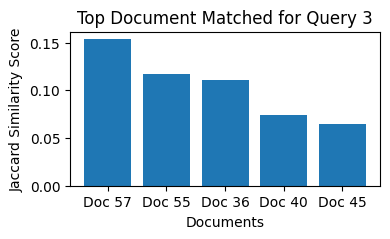

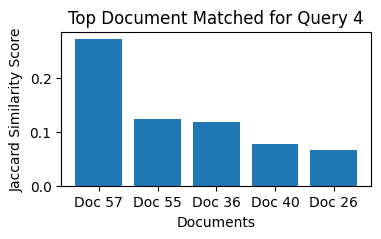

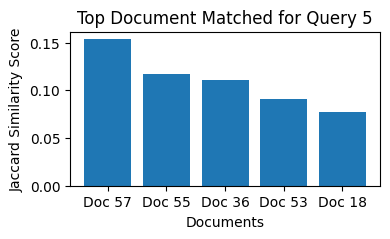

...

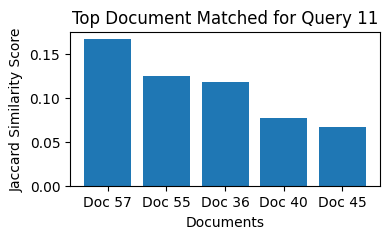

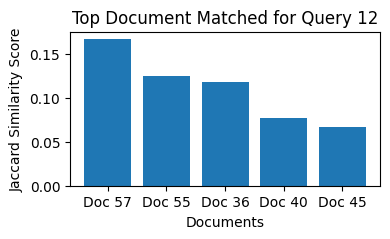

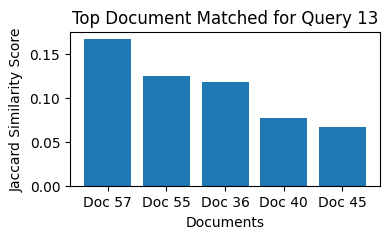

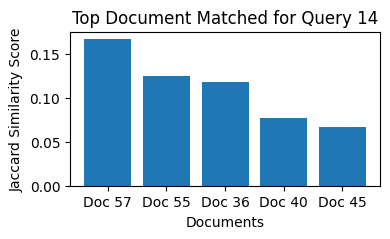

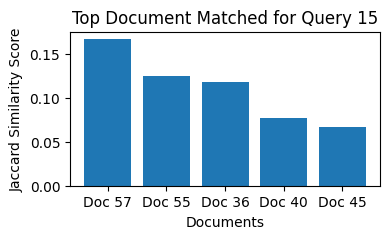

In [ ]:
import matplotlib.pyplot as plt

for i, ranked_docs_for_query in enumerate(ranked_docs_jc):
    # Get the top 5 documents
    doc_indices, scores = zip(*ranked_docs_for_query[:5])

    plt.figure(figsize=(4, 2))
    plt.bar(range(len(doc_indices)), scores, tick_label=[f"Doc {idx+1}" for idx in doc_indices])
    plt.title(f"Top Document Matched for Query {i+1}")
    plt.xlabel("Documents")
    plt.ylabel("Jaccard Similarity Score")
    plt.show()

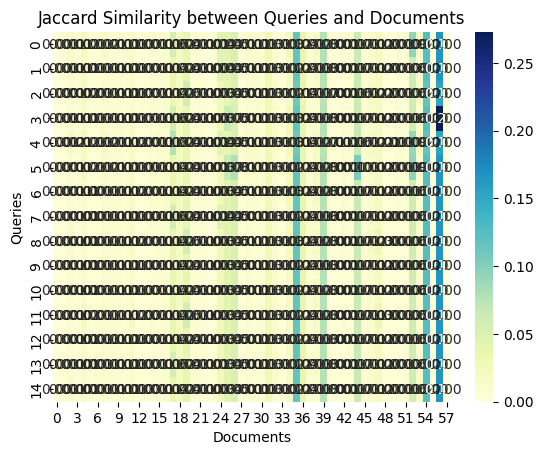

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

num_queries = len(query_sets)
num_docs = len(doc_sets)

similarities_matrix = [[0 for _ in range(num_docs)] for _ in range(num_queries)]

for i, query_set in enumerate(query_sets):
    for j, doc_set in enumerate(doc_sets):
        similarity = jaccard_similarity(query_set, doc_set)
        similarities_matrix[i][j] = similarity

sns.heatmap(similarities_matrix, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Jaccard Similarity between Queries and Documents")
plt.xlabel("Documents")
plt.ylabel("Queries")
plt.show()

In [ ]:
print("Jaccard Similarities:")
for query_set in query_sets:
    similarities_jc = [(doc_index, jaccard_similarity(query_set, doc_sets[doc_index])) for doc_index in range(len(doc_sets))]
    print(f"{similarities_jc[:5]}")  # to print first 5 similarities
    ranked_docs_for_query = sorted(similarities_jc, key=lambda x: x[1], reverse=True)
    ranked_docs_jc.append(ranked_docs_for_query)

# first few docs with JC scores
print("First few ranked documents for the first query:", ranked_docs_jc[0][:5])

Jaccard Similarities:
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.013636363636363636), (3, 0.006263048016701462), (4, 0.022058823529411766)]
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.013636363636363636), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.001310615989515072), (1, 0.003656307129798903), (2, 0.009009009009009009), (3, 0.004158004158004158), (4, 0.021897810218978103)]
[(0, 0.0013111888111888112), (1, 0.005504587155963303), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.0017482517482517483), (1, 0.005494505494505495), (2, 0.01818181818181818), (3, 0.008350730688935281), (4, 0.021897810218978103)]
[(0, 0.0013111888111888112), (1, 0.003663003663003663), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.022058823529411766)]
[(0, 0.0013111888111888112), (1, 0.003663003663003663), (2, 0.00904977375565611), (3, 0.006263048016701462), (4, 0.014598540145985401)]
[(0, 0.00131118881118881

In [ ]:
# (56, 0.16666666666666666), (54, 0.125), (35, 0.11764705882352941), (52, 0.09375), (39, 0.07692307692307693)
import pandas as pd

ranked_results_JC = [(56, 0.16666666666666666), (54, 0.125), (35, 0.11764705882352941), (52, 0.09375), (39, 0.07692307692307693)]
top_5 = ranked_results_JC[:5]

df = pd.DataFrame([{'ID': doc_IDS[index], 'Title': doc_titles[index], 'Score': score} for index, score in top_5])


df.sort_values(by='Score', ascending=False, inplace=True)


df.set_index('ID', inplace=True)

print("Top 5 Documents for Jacacard Similarity Model:")
print(df)


Top 5 Documents for Jacacard Similarity Model:
                                       Title     Score
ID                                                    
56  Category:People with Parkinson's disease  0.166667
54          Category:Antiparkinsonian agents  0.125000
35                               Minzasolmin  0.117647
52                                 Tremorine  0.093750
39             Parkinson's Disease (journal)  0.076923


# **Ensemble method using Cosine and Jaccard similarity scores**

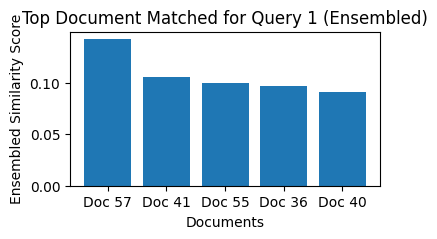

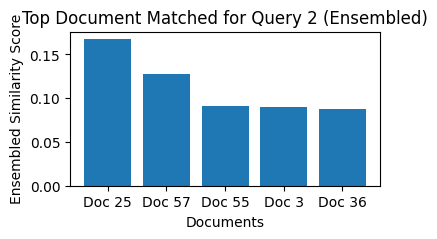

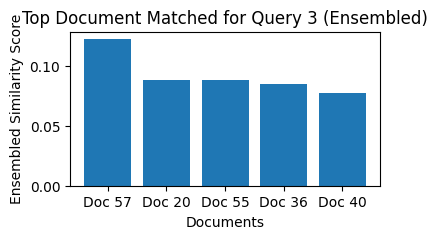

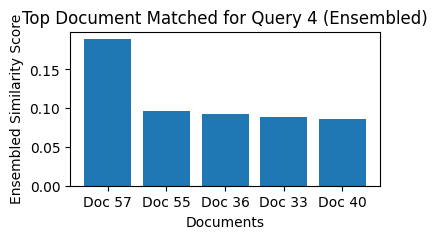

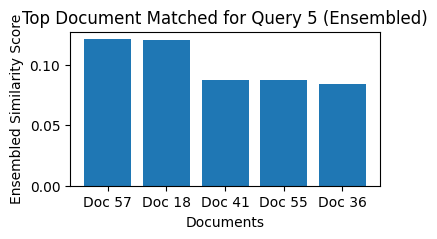

...

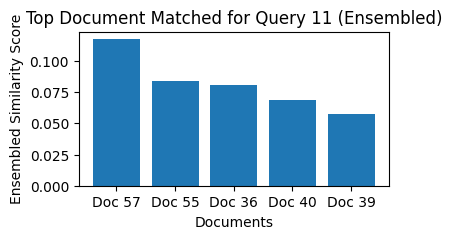

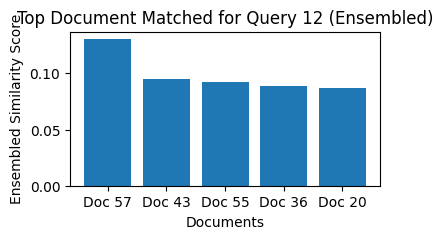

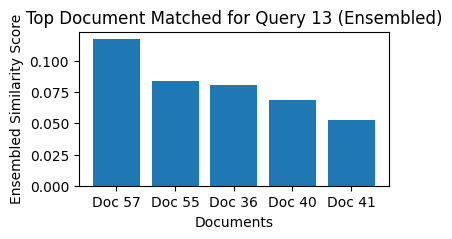

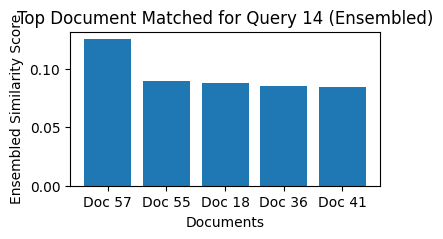

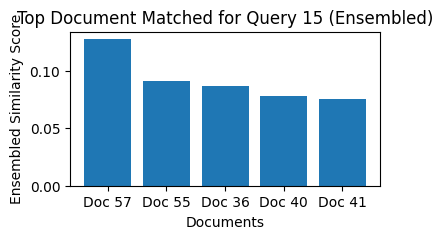

In [ ]:
import matplotlib.pyplot as plt


for i, query_set in enumerate(query_sets):
    # Jaccard Similarities
    jaccard_similarities = [jaccard_similarity(query_set, doc_set) for doc_set in doc_sets]

    # Cosine Similarities
    cosine_similarities_for_query = cosine_similarities0[i]

    # Combination
    combined_scores = [(jaccard + cosine) / 2 for jaccard, cosine in zip(jaccard_similarities, cosine_similarities_for_query)]

    # Rank documents based on the combined score
    ranked_docs_combined_avg = sorted(enumerate(combined_scores), key=lambda x: x[1], reverse=True)


    doc_indices, scores = zip(*ranked_docs_combined_avg[:5])
    plt.figure(figsize=(4, 2))
    plt.bar(range(len(doc_indices)), scores, tick_label=[f"Doc {idx+1}" for idx in doc_indices])
    plt.title(f"Top Document Matched for Query {i+1} (Ensembled)")
    plt.xlabel("Documents")
    plt.ylabel("Ensembled Similarity Score")
    plt.show()


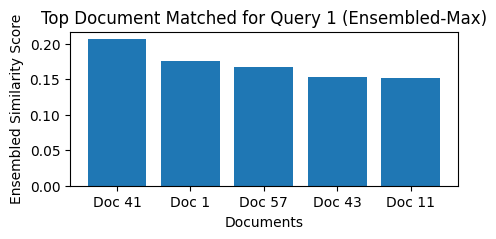

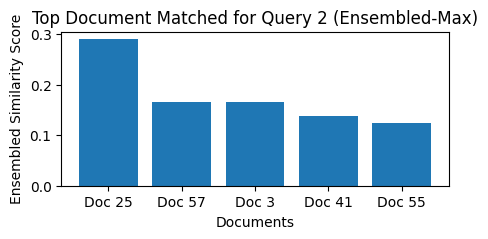

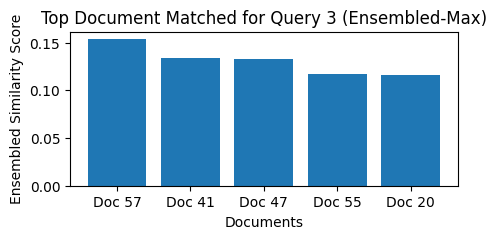

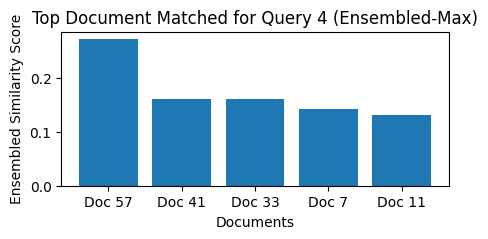

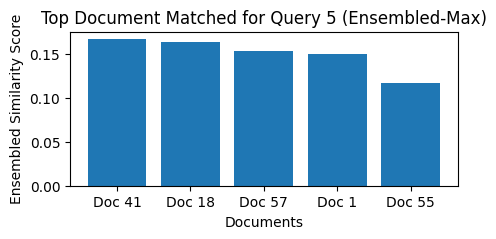

...

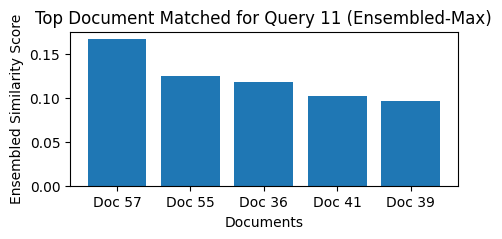

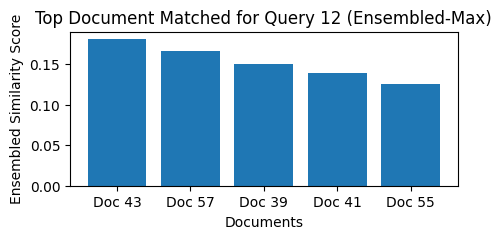

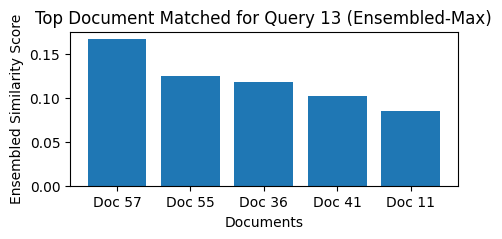

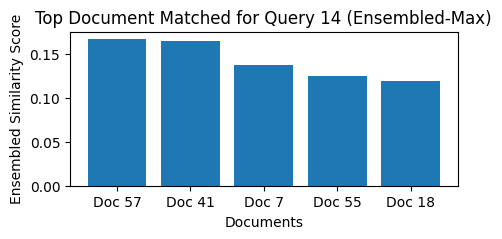

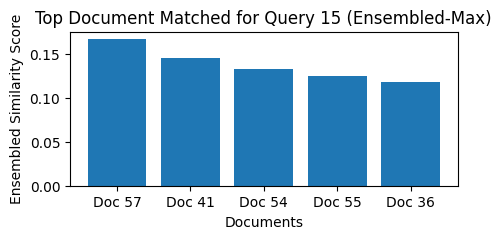

In [ ]:
import matplotlib.pyplot as plt

for i, query_set in enumerate(query_sets):
    # Jaccard Similarities
    jaccard_similarities = [jaccard_similarity(query_set, doc_set) for doc_set in doc_sets]

    # Cosine Similarities
    cosine_similarities_for_query = cosine_similarities0[i]

    # Combine the scores by taking the maximum
    combined_scores_max = [max(jaccard, cosine) for jaccard, cosine in zip(jaccard_similarities, cosine_similarities_for_query)]

    # Rank documents based on the combined score
    ranked_docs_combined_max = sorted(enumerate(combined_scores_max), key=lambda x: x[1], reverse=True)


    doc_indices, scores = zip(*ranked_docs_combined_max[:5])
    plt.figure(figsize=(5, 2))
    plt.bar(range(len(doc_indices)), scores, tick_label=[f"Doc {idx+1}" for idx in doc_indices])
    plt.title(f"Top Document Matched for Query {i+1} (Ensembled-Max)")
    plt.xlabel("Documents")
    plt.ylabel("Ensembled Similarity Score")
    plt.show()


In [ ]:
print(ranked_docs_combined_avg)

[(56, 0.12757934360008286), (54, 0.09069303341591184), (35, 0.08707122816377436), (39, 0.07807153932828319), (40, 0.0752508952035354), (53, 0.07415182883154522), (2, 0.05892881108732613), (10, 0.057666324825338816), (52, 0.05422070297618071), (32, 0.05413286928720542), (34, 0.05102364430612037), (44, 0.05062831985847294), (6, 0.04932143009718156), (0, 0.04587772611005094), (19, 0.04358072351654055), (36, 0.043499596944777896), (38, 0.043193275873321724), (26, 0.04138160782534778), (24, 0.04037157628860141), (43, 0.037743670599475004), (23, 0.03675062785025461), (33, 0.03652845166618316), (48, 0.03431777832967766), (42, 0.03427643710906949), (17, 0.03339006011051631), (25, 0.03308772866891543), (11, 0.032768623645853485), (3, 0.03212783036263367), (7, 0.03050150166368825), (28, 0.027349019124430825), (14, 0.026520392419539275), (29, 0.02359362441095199), (20, 0.02342481739195452), (31, 0.022728826787619644), (9, 0.021801219999289988), (1, 0.021385892209909597), (51, 0.019684529479625568

In [ ]:
import pandas as pd

ranked_results_Ensb_avg = [(56, 0.12757934360008286), (54, 0.09069303341591184), (35, 0.08707122816377436), (39, 0.07807153932828319), (40, 0.07523605570348955)]
top_5 = ranked_results_Ensb_avg[:5]

df = pd.DataFrame([{'ID': doc_IDS[index], 'Title': doc_titles[index], 'Score': score} for index, score in top_5])

df.sort_values(by='Score', ascending=False, inplace=True)

df.set_index('ID', inplace=True)

print("Top 5 Documents for Ensemble-Avg Model:")
print(df)


Top 5 Documents for Ensemble-Avg Model:
                                       Title     Score
ID                                                    
56  Category:People with Parkinson's disease  0.127579
54          Category:Antiparkinsonian agents  0.090693
35                               Minzasolmin  0.087071
39             Parkinson's Disease (journal)  0.078072
40     Parkinson's disease clinical research  0.075236


In [ ]:
print(ranked_docs_combined_max)

[(56, 0.16666666666666666), (40, 0.14566308072965142), (53, 0.13275961621231325), (54, 0.125), (35, 0.11764705882352941), (10, 0.10965083146885946), (2, 0.10422125853828862), (32, 0.09841352182564236), (6, 0.09098979896987333), (0, 0.09044426340891307), (34, 0.08402927059422273), (39, 0.07922000173348945), (38, 0.07380793539444219), (33, 0.0710285057664434), (43, 0.0704240500597095), (23, 0.06877312331280236), (44, 0.06666666666666667), (48, 0.06483808830492493), (42, 0.06258272496440763), (52, 0.06060606060606061), (3, 0.06008899405860067), (11, 0.05271673447119415), (24, 0.051331387871320466), (26, 0.05128205128205128), (7, 0.05079892169472344), (36, 0.04853765542801733), (19, 0.0479457607585713), (14, 0.04774977954807326), (28, 0.045174228725052126), (25, 0.043478260869565216), (29, 0.039887978748911285), (20, 0.038806739341549795), (17, 0.03773584905660377), (1, 0.03726719726385589), (9, 0.0360266824228224), (51, 0.033357034911154944), (41, 0.03060348270891599), (31, 0.028985507246

In [ ]:
import pandas as pd

ranked_results_Ensb_max = [(56, 0.16666666666666666), (40, 0.14563340172955974), (53, 0.13275838606503582), (54, 0.125), (35, 0.11764705882352941)]
top_5 = ranked_results_Ensb_max[:5]

df = pd.DataFrame([{'ID': doc_IDS[index], 'Title': doc_titles[index], 'Score': score} for index, score in top_5])

df.sort_values(by='Score', ascending=False, inplace=True)

df.set_index('ID', inplace=True)

print("Top 5 Documents for Ensemble-Max Model:")
print(df)

Top 5 Documents for Ensemble-Max Model:
                                       Title     Score
ID                                                    
56  Category:People with Parkinson's disease  0.166667
40     Parkinson's disease clinical research  0.145633
53  Unified Parkinson's disease rating scale  0.132758
54          Category:Antiparkinsonian agents  0.125000
35                               Minzasolmin  0.117647


# **Comparison of all the models for Ranking the Top 5 Documents**

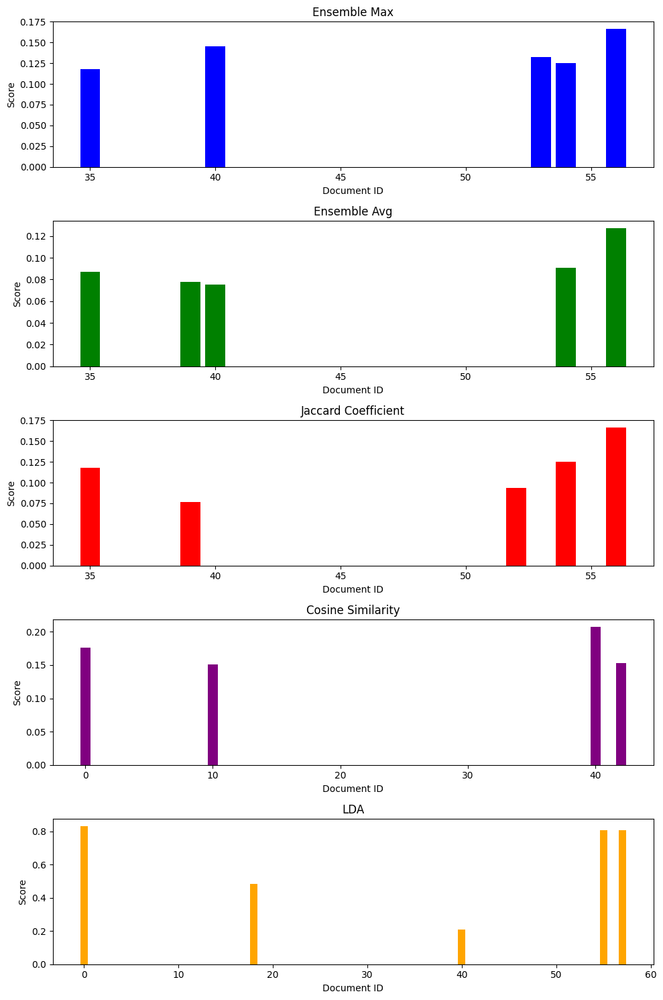

In [ ]:
# Data for each ranking method
ranked_results_Ensb_max = [(56, 0.16666666666666666), (40, 0.14563340172955974), (53, 0.13275838606503582), (54, 0.125), (35, 0.11764705882352941)]
ranked_results_Ensb_avg = [(56, 0.12757934360008286), (54, 0.09069303341591184), (35, 0.08707122816377436), (39, 0.07807153932828319), (40, 0.07523605570348955)]
ranked_results_JC = [(56, 0.16666666666666666), (54, 0.125), (35, 0.11764705882352941), (52, 0.09375), (39, 0.07692307692307693)]
ranked_results_CS = [(40, 0.20782537026096448), (0, 0.1759), (42, 0.1535), (10, 0.1513), (0, 0.1387)]
ranked_results_LDA = [(40, 0.20782537026096448), (18, 0.4853536195154945), (55, 0.8058838330697913), (57, 0.8058838330697913), (0, 0.8325546123015592)]

doc_ids_ensb_max, scores_ensb_max = zip(*ranked_results_Ensb_max)
doc_ids_ensb_avg, scores_ensb_avg = zip(*ranked_results_Ensb_avg)
doc_ids_jc, scores_jc = zip(*ranked_results_JC)
doc_ids_cs, scores_cs = zip(*ranked_results_CS)
doc_ids_lda, scores_lda = zip(*ranked_results_LDA)

fig, axs = plt.subplots(5, 1, figsize=(10, 15))

axs[0].bar(doc_ids_ensb_max, scores_ensb_max, color='blue')
axs[0].set_title('Ensemble Max')
axs[0].set_xlabel('Document ID')
axs[0].set_ylabel('Score')

axs[1].bar(doc_ids_ensb_avg, scores_ensb_avg, color='green')
axs[1].set_title('Ensemble Avg')
axs[1].set_xlabel('Document ID')
axs[1].set_ylabel('Score')

axs[2].bar(doc_ids_jc, scores_jc, color='red')
axs[2].set_title('Jaccard Coefficient')
axs[2].set_xlabel('Document ID')
axs[2].set_ylabel('Score')

axs[3].bar(doc_ids_cs, scores_cs, color='purple')
axs[3].set_title('Cosine Similarity')
axs[3].set_xlabel('Document ID')
axs[3].set_ylabel('Score')

axs[4].bar(doc_ids_lda, scores_lda, color='orange')
axs[4].set_title('LDA')
axs[4].set_xlabel('Document ID')
axs[4].set_ylabel('Score')

plt.tight_layout()
plt.show()


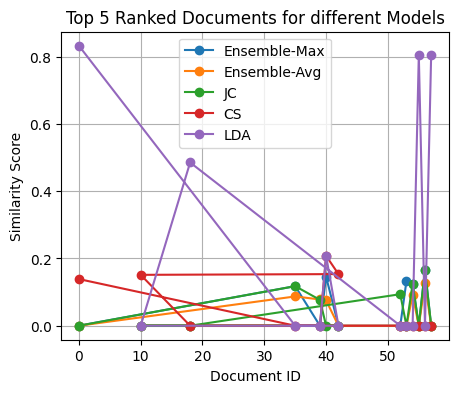

In [ ]:
ranked_results_Ensb_max = [(56, 0.16666666666666666), (40, 0.14563340172955974), (53, 0.13275838606503582), (54, 0.125), (35, 0.11764705882352941)]
ranked_results_Ensb_avg = [(56, 0.12757934360008286), (54, 0.09069303341591184), (35, 0.08707122816377436), (39, 0.07807153932828319), (40, 0.07523605570348955)]
ranked_results_JC = [(56, 0.16666666666666666), (54, 0.125), (35, 0.11764705882352941), (52, 0.09375), (39, 0.07692307692307693)]
ranked_results_CS = [(40, 0.20782537026096448), (0, 0.1759), (42, 0.1535), (10, 0.1513), (0, 0.1387)]
ranked_results_LDA = [(40, 0.20782537026096448), (18, 0.4853536195154945), (55, 0.8058838330697913), (57, 0.8058838330697913), (0, 0.8325546123015592)]

doc_ids_ensb_max, scores_ensb_max = zip(*ranked_results_Ensb_max)
doc_ids_ensb_avg, scores_ensb_avg = zip(*ranked_results_Ensb_avg)
doc_ids_jc, scores_jc = zip(*ranked_results_JC)
doc_ids_cs, scores_cs = zip(*ranked_results_CS)
doc_ids_lda, scores_lda = zip(*ranked_results_LDA)

all_doc_ids = set(doc_ids_ensb_max + doc_ids_ensb_avg + doc_ids_jc + doc_ids_cs + doc_ids_lda)


scores_by_method = {
    'Ensemble-Max': {doc_id: 0 for doc_id in all_doc_ids},
    'Ensemble-Avg': {doc_id: 0 for doc_id in all_doc_ids},
    'JC': {doc_id: 0 for doc_id in all_doc_ids},
    'CS': {doc_id: 0 for doc_id in all_doc_ids},
    'LDA': {doc_id: 0 for doc_id in all_doc_ids}
}

for doc_id, score in ranked_results_Ensb_max:
    scores_by_method['Ensemble-Max'][doc_id] = score

for doc_id, score in ranked_results_Ensb_avg:
    scores_by_method['Ensemble-Avg'][doc_id] = score

for doc_id, score in ranked_results_JC:
    scores_by_method['JC'][doc_id] = score

for doc_id, score in ranked_results_CS:
    scores_by_method['CS'][doc_id] = score

for doc_id, score in ranked_results_LDA:
    scores_by_method['LDA'][doc_id] = score


plt.figure(figsize=(5, 4))


for method, scores in scores_by_method.items():
    plt.plot(list(scores.keys()), list(scores.values()), marker='o', label=method)

plt.xlabel('Document ID')
plt.ylabel('Similarity Score')
plt.title('Top 5 Ranked Documents for different Models')
plt.legend()
plt.grid(True)
plt.show()

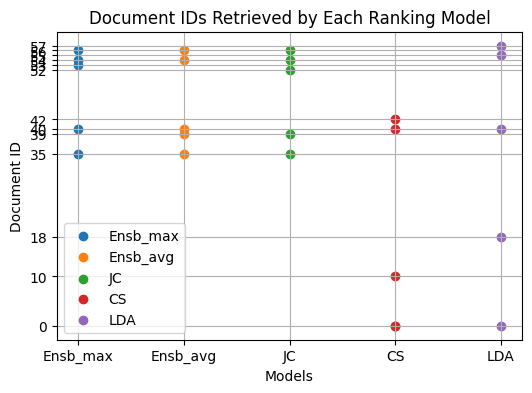

In [ ]:
unique_doc_ids = set()
for result in [ranked_results_Ensb_max, ranked_results_Ensb_avg, ranked_results_JC, ranked_results_CS, ranked_results_LDA]:
    unique_doc_ids.update([doc_id for doc_id, _ in result])

models = ["Ensb_max", "Ensb_avg", "JC", "CS", "LDA"]

plt.figure(figsize=(6, 4))

for i, model in enumerate(models):
    results = eval(f"ranked_results_{model.replace('_', '_')}")
    doc_ids = [doc_id for doc_id, _ in results]
    plt.scatter([model] * len(doc_ids), doc_ids, label=model)

plt.xticks(range(len(models)), models)
plt.yticks(sorted(unique_doc_ids))
plt.ylabel('Document ID')
plt.xlabel('Models')
plt.title('Document IDs Retrieved by Each Ranking Model')
plt.legend()
plt.grid(True)
plt.show()

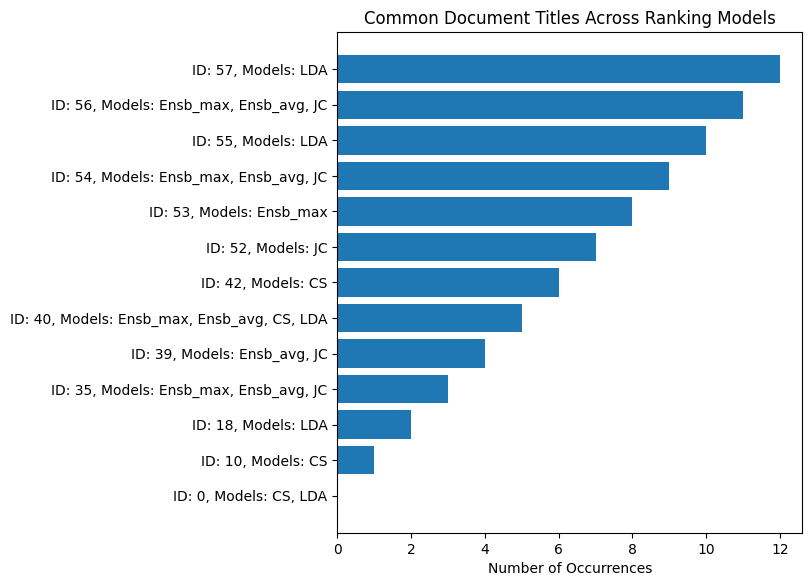

In [ ]:
doc_ids_ensb_max = [doc_id for doc_id, _ in ranked_results_Ensb_max]
doc_ids_ensb_avg = [doc_id for doc_id, _ in ranked_results_Ensb_avg]
doc_ids_jc = [doc_id for doc_id, _ in ranked_results_JC]
doc_ids_cs = [doc_id for doc_id, _ in ranked_results_CS]
doc_ids_lda = [doc_id for doc_id, _ in ranked_results_LDA]

common_doc_ids = set(doc_ids_ensb_max) | set(doc_ids_ensb_avg) | set(doc_ids_jc) | set(doc_ids_cs) | set(doc_ids_lda)

common_titles = [doc_titles[doc_id] for doc_id in common_doc_ids]

models = ["Ensb_max", "Ensb_avg", "JC", "CS", "LDA"]
data_for_plot = []
for doc_id in common_doc_ids:
    models_present = []
    for model in models:
        if doc_id in eval(f"doc_ids_{model.lower()}"):
            models_present.append(model)
    data_for_plot.append((doc_id, doc_titles[doc_id], ", ".join(models_present)))

data_for_plot.sort(key=lambda x: x[0])

ids, titles, models_present = zip(*data_for_plot)

plt.figure(figsize=(6, len(common_doc_ids)*0.5))
plt.barh(titles, range(len(titles)), tick_label=[f"ID: {id}, Models: {model}" for id, model in zip(ids, models_present)])
plt.xlabel('Number of Occurrences')
plt.title('Common Document Titles Across Ranking Models')
plt.show()

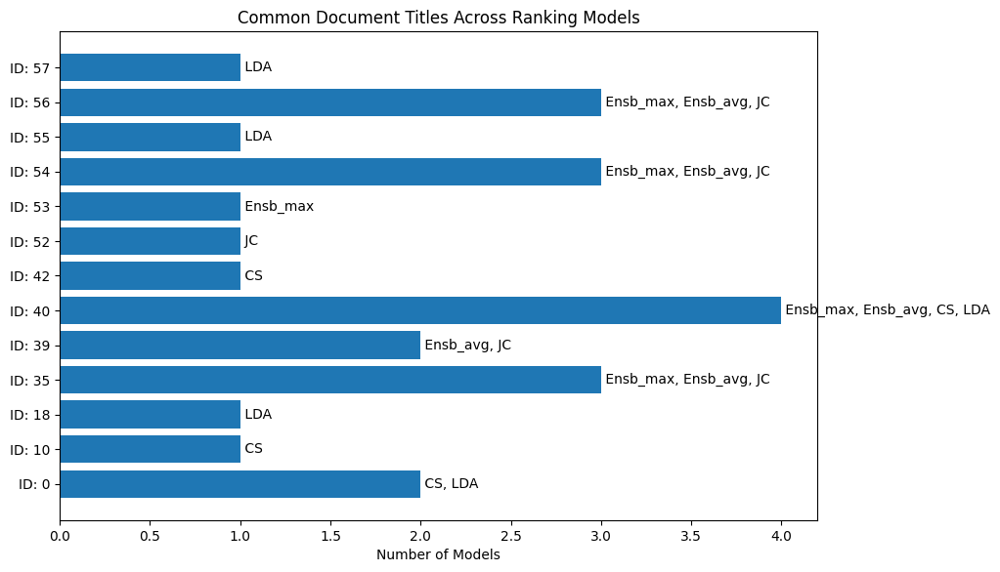

In [ ]:
data_for_plot = []
for doc_id in common_doc_ids:
    models_present = []
    for model in models:
        if doc_id in eval(f"doc_ids_{model.lower()}"):
            models_present.append(model)
    data_for_plot.append((doc_id, doc_titles[doc_id], len(models_present), ", ".join(models_present)))

data_for_plot.sort(key=lambda x: x[0])

ids, titles, weights, models_present = zip(*data_for_plot)

plt.figure(figsize=(10, len(common_doc_ids)*0.5))
bars = plt.barh(titles, weights, tick_label=[f"ID: {id}" for id in ids])

for bar, model in zip(bars, models_present):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f' {model}', va='center')

plt.xlabel('Number of Models')
plt.title('Common Document Titles Across Ranking Models')
plt.show()

In [ ]:
#Assigning common weights to the documents
import pandas as pd


data_for_table = []
for doc_id in common_doc_ids:
    models_present = []
    for model in models:
        if doc_id in eval(f"doc_ids_{model.lower()}"):
            models_present.append(model)
    common_weight = len(models_present)
    data_for_table.append({
        "Document ID": doc_id,
        "Title": doc_titles[doc_id],
        "Common Weight": common_weight,
        "Retrieved by Models": ", ".join(models_present)
    })

df = pd.DataFrame(data_for_table)


df.sort_values(by='Common Weight', ascending=False, inplace=True)


df.reset_index(drop=True, inplace=True)
pd.set_option('display.max_colwidth', 50)
pd.set_option('display.width', 10)

df


,Document ID,Title,Common Weight,Retrieved by Models
0,40,Parkinson's disease clinical research,4,"Ensb_max, Ensb_avg, CS, LDA"
1,35,Minzasolmin,3,"Ensb_max, Ensb_avg, JC"
2,54,Category:Antiparkinsonian agents,3,"Ensb_max, Ensb_avg, JC"
3,56,Category:People with Parkinson's disease,3,"Ensb_max, Ensb_avg, JC"
4,0,Parkinson's disease,2,"CS, LDA"
5,39,Parkinson's Disease (journal),2,"Ensb_avg, JC"
6,42,Parkinsonism,1,CS
7,10,Diane G. Cook,1,CS
8,18,Fox Trial Finder,1,LDA
9,52,Tremorine,1,JC


# **Term frequencies in the Common retrieved and ranked Documents**

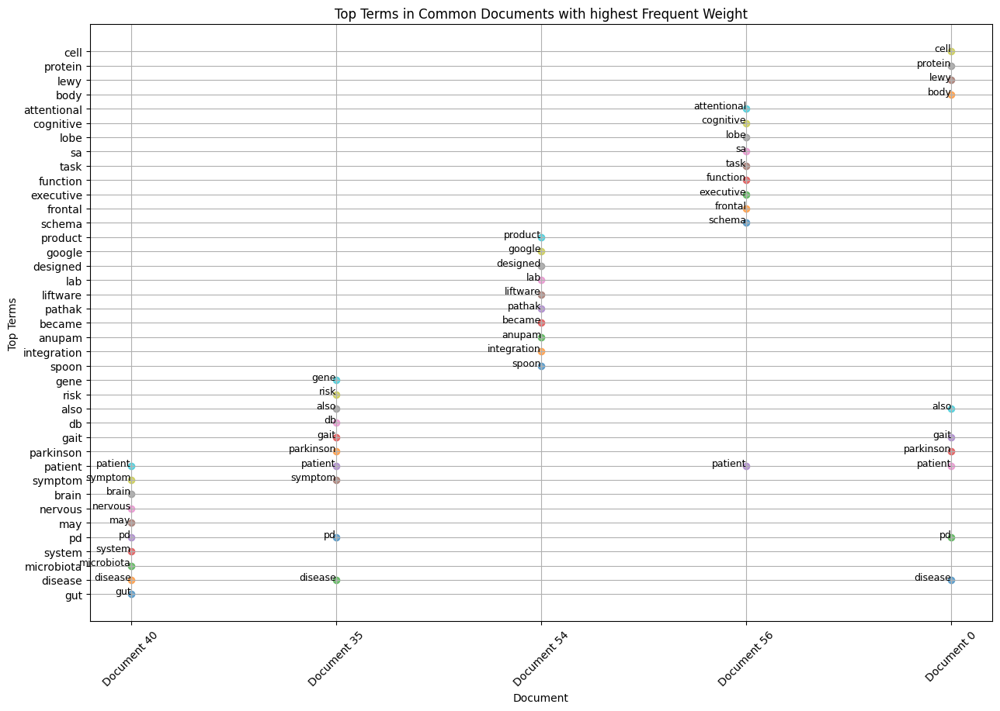

In [ ]:
import matplotlib.pyplot as plt

documents_data = {
    "Document 40": ["gut", "disease", "microbiota", "system", "pd", "may", "nervous", "brain", "symptom", "patient"],
    "Document 35": ["pd", "parkinson", "disease", "gait", "patient", "symptom", "db", "also", "risk", "gene"],
    "Document 54": ["spoon", "integration", "anupam", "became", "pathak", "liftware", "lab", "designed", "google", "product"],
    "Document 56": ["schema", "frontal", "executive", "function", "patient", "task", "sa", "lobe", "cognitive", "attentional"],
    "Document 0": ["disease", "body", "pd", "parkinson", "gait", "lewy", "patient", "protein", "cell", "also"],

}

plt.figure(figsize=(15, 10))

for doc, terms in documents_data.items():
    for term in terms:
        plt.scatter(doc, term, alpha=0.6)
        plt.text(doc, term, term, fontsize=9, ha='right')

plt.xlabel('Document')
plt.ylabel('Top Terms')
plt.title('Top Terms in Common Documents with highest Frequent Weight')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [ ]:
#total term frequencies in top frequent documents
import pandas as pd
from collections import Counter

documents_data = {
    "Document 40": ["gut", "disease", "microbiota", "system", "pd", "may", "nervous", "brain", "symptom", "patient"],
    "Document 35": ["pd", "parkinson", "disease", "gait", "patient", "symptom", "db", "also", "risk", "gene"],
    "Document 54": ["spoon", "integration", "anupam", "became", "pathak", "liftware", "lab", "designed", "google", "product"],
    "Document 56": ["schema", "frontal", "executive", "function", "patient", "task", "sa", "lobe", "cognitive", "attentional"],
    "Document 0": ["disease", "body", "pd", "parkinson", "gait", "lewy", "patient", "protein", "cell", "also"],

}


all_terms = [term for terms in documents_data.values() for term in terms]


term_frequencies = Counter(all_terms)

df = pd.DataFrame(term_frequencies.items(), columns=["Term", "No of Most Frequent in Top Documents"])

df.sort_values(by='No of Most Frequent in Top Documents', ascending=False, inplace=True)


df.reset_index(drop=True, inplace=True)


df.head(5)


,Term,No of Most Frequent in Top Documents
0,patient,4
1,pd,3
2,disease,3
3,gait,2
4,symptom,2


## **Relevance Measurement**

In [ ]:
#document modeling using LDA
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string

# Preprocess
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([word for word in doc.lower().split() if word not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in all_documents]


dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]


ldamodel = LdaModel(doc_term_matrix, num_topics=58, id2word = dictionary, passes=50)


print(ldamodel.print_topics(num_topics=58, num_words=5))

[(0, '0.037*"paralysis" + 0.034*"century" + 0.023*"tremor" + 0.021*"description" + 0.021*"agitans"'), (1, '0.024*"dyskinesia" + 0.022*"syndrome" + 0.017*"parkinsonplus" + 0.014*"muscle" + 0.014*"movement"'), (2, '0.023*"repetition" + 0.018*"palilalia" + 0.017*"speech" + 0.015*"disorder" + 0.012*"word"'), (3, '0.000*"parkinson" + 0.000*"pd" + 0.000*"disease" + 0.000*"symptom" + 0.000*"patient"'), (4, '0.000*"disease" + 0.000*"pd" + 0.000*"parkinson" + 0.000*"patient" + 0.000*"gait"'), (5, '0.061*"bradyphrenia" + 0.037*"patient" + 0.027*"researcher" + 0.026*"found" + 0.025*"condition"'), (6, '0.000*"patient" + 0.000*"disease" + 0.000*"pd" + 0.000*"parkinson" + 0.000*"symptom"'), (7, '0.032*"catalepsy" + 0.009*"cataleptic" + 0.007*"novel" + 0.007*"character" + 0.007*"state"'), (8, '0.041*"gut" + 0.022*"microbiota" + 0.021*"system" + 0.016*"axis" + 0.016*"nervous"'), (9, '0.040*"stage" + 0.034*"disease" + 0.017*"lewy" + 0.017*"braak" + 0.015*"nucleus"'), (10, '0.000*"disease" + 0.000*"pd" 

In [ ]:
#LDA relevance
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

query = "Parkinson's Disease"
query_clean = clean(query)
query_bow = dictionary.doc2bow(query_clean.split())
query_lda = ldamodel[query_bow]
print("Preprocessed Query:",query_clean)



from gensim.matutils import sparse2full
from scipy.spatial.distance import jensenshannon

def get_similarity(doc_lda, query_lda):

    doc_dense = sparse2full(doc_lda, num_topics)
    query_dense = sparse2full(query_lda, num_topics)
    return jensenshannon(doc_dense, query_dense)

similarities_LDA = [get_similarity(ldamodel[doc], query_lda) for doc in doc_term_matrix]


threshold = 0.05
relevant_docs_indices = [idx for idx, score in enumerate(similarities) if score >= threshold]
relevant_docs_indices.sort(key=lambda idx: similarities[idx], reverse=True)

num_ranked_docs_lda = len(relevant_docs_indices)
print("Total relevant documents for LDA:", num_ranked_docs_lda)

print("Relevant documents for  the baseline model LDA):")
for idx in relevant_docs_indices:
    print(f"Document {idx+1} with LDA-based Similarity = {similarities[idx]:.4f}")

Preprocessed Query: parkinson disease
Total relevant documents for LDA: 7
Relevant documents for  the baseline model LDA):
Document 57 with LDA-based Similarity = 0.1667
Document 55 with LDA-based Similarity = 0.1250
Document 36 with LDA-based Similarity = 0.1176
Document 40 with LDA-based Similarity = 0.0769
Document 45 with LDA-based Similarity = 0.0667
Document 53 with LDA-based Similarity = 0.0606
Document 27 with LDA-based Similarity = 0.0513


In [ ]:
# For Query 1
query_1_cosine_scores = cosine_similarities0[0]

threshold = 0.05
relevant_documents_query_1 = [(idx, score) for idx, score in enumerate(query_1_cosine_scores) if score >= threshold]

relevant_documents_query_1.sort(key=lambda x: x[1], reverse=True)

num_ranked_docs_CSS = len(relevant_documents_query_1)
print("Total ranked documents for CS:", num_ranked_docs_CSS)

print("Relevant documents for CS:")
for doc_idx, score in relevant_documents_query_1:
    print(f"Document {doc_idx} with Cosine Similarity = {score:.4f}")

Total ranked documents for CS: 36
Relevant documents for CS:
Document 40 with Cosine Similarity = 0.2067
Document 0 with Cosine Similarity = 0.1759
Document 42 with Cosine Similarity = 0.1535
Document 10 with Cosine Similarity = 0.1513
Document 48 with Cosine Similarity = 0.1387
Document 33 with Cosine Similarity = 0.1386
Document 14 with Cosine Similarity = 0.1371
Document 24 with Cosine Similarity = 0.1340
Document 34 with Cosine Similarity = 0.1326
Document 32 with Cosine Similarity = 0.1312
Document 53 with Cosine Similarity = 0.1298
Document 15 with Cosine Similarity = 0.1185
Document 56 with Cosine Similarity = 0.1180
Document 38 with Cosine Similarity = 0.1130
Document 23 with Cosine Similarity = 0.1123
Document 2 with Cosine Similarity = 0.1111
Document 6 with Cosine Similarity = 0.1063
Document 39 with Cosine Similarity = 0.1056
Document 43 with Cosine Similarity = 0.1043
Document 3 with Cosine Similarity = 0.1006
Document 17 with Cosine Similarity = 0.0849
Document 29 with Co

In [ ]:
query_1_jaccard_scores = [jaccard_similarity(query_sets[0], doc_set) for doc_set in doc_sets]


threshold = 0.05
relevant_documents_query_2 = [(idx, score) for idx, score in enumerate(query_1_jaccard_scores) if score >= threshold]

relevant_documents_query_2.sort(key=lambda x: x[1], reverse=True)


num_ranked_docs_JC = len(relevant_documents_query_2)
print("Total relevant documents for JC:", num_ranked_docs_JC)

print("Relevant documents for JC:")
for doc_idx, score in relevant_documents_query_2:
    print(f"Document {doc_idx} with Jaccard Similarity = {score:.4f}")


Total relevant documents for JC: 8
Relevant documents for JC:
Document 56 with Jaccard Similarity = 0.1667
Document 54 with Jaccard Similarity = 0.1250
Document 35 with Jaccard Similarity = 0.1176
Document 52 with Jaccard Similarity = 0.0938
Document 39 with Jaccard Similarity = 0.0769
Document 44 with Jaccard Similarity = 0.0667
Document 17 with Jaccard Similarity = 0.0577
Document 26 with Jaccard Similarity = 0.0513


In [ ]:
threshold = 0.05
relevant_documents_query_3 = [(idx, score) for idx, score in enumerate(combined_scores) if score >= threshold]

relevant_documents_query_3.sort(key=lambda x: x[1], reverse=True)

num_ranked_docs_ComSAvg = len(relevant_documents_query_3)
print("Total relevant documents for Ensemble-Avg:", num_ranked_docs_ComSAvg)

print("Relevant documents for Ensemble-Avg:")
for doc_idx, score in relevant_documents_query_3:
    print(f"Document {doc_idx} with Combined Score = {score:.4f}")

Total relevant documents for Ensemble-Avg: 12
Relevant documents for Ensemble-Avg:
Document 56 with Combined Score = 0.1276
Document 54 with Combined Score = 0.0907
Document 35 with Combined Score = 0.0871
Document 39 with Combined Score = 0.0781
Document 40 with Combined Score = 0.0753
Document 53 with Combined Score = 0.0742
Document 2 with Combined Score = 0.0589
Document 10 with Combined Score = 0.0577
Document 52 with Combined Score = 0.0542
Document 32 with Combined Score = 0.0541
Document 34 with Combined Score = 0.0510
Document 44 with Combined Score = 0.0506


In [ ]:
threshold = 0.05
relevant_documents_query_4 = [(idx, score) for idx, score in enumerate(combined_scores_max) if score >= threshold]

relevant_documents_query_4.sort(key=lambda x: x[1], reverse=True)

num_ranked_docs_ComSMax = len(relevant_documents_query_4)
print("Total relevant documents for Ensemble-Max:", num_ranked_docs_ComSMax)

print("Relevant documents for Ensemble-Max:")
for doc_idx, score in relevant_documents_query_4:
    print(f"Document {doc_idx} with Combined Score = {score:.4f}")

Total relevant documents for Ensemble-Max: 25
Relevant documents for Ensemble-Max:
Document 56 with Combined Score = 0.1667
Document 40 with Combined Score = 0.1457
Document 53 with Combined Score = 0.1328
Document 54 with Combined Score = 0.1250
Document 35 with Combined Score = 0.1176
Document 10 with Combined Score = 0.1097
Document 2 with Combined Score = 0.1042
Document 32 with Combined Score = 0.0984
Document 6 with Combined Score = 0.0910
Document 0 with Combined Score = 0.0904
Document 34 with Combined Score = 0.0840
Document 39 with Combined Score = 0.0792
Document 38 with Combined Score = 0.0738
Document 33 with Combined Score = 0.0710
Document 43 with Combined Score = 0.0704
Document 23 with Combined Score = 0.0688
Document 44 with Combined Score = 0.0667
Document 48 with Combined Score = 0.0648
Document 42 with Combined Score = 0.0626
Document 52 with Combined Score = 0.0606
Document 3 with Combined Score = 0.0601
Document 11 with Combined Score = 0.0527
Document 24 with Co

In [ ]:
# table to represent the overall number of relevant documents
import pandas as pd

data = {
    "Model": ["LDA", "CS", "JC", "Ensemble-Avg", "Ensemble-Max"],
    "Total Relevant Documents": [7, 36, 8, 12, 25]
}


df = pd.DataFrame(data)

df



,Model,Total Relevant Documents
0,LDA,7
1,CS,36
2,JC,8
3,Ensemble-Avg,12
4,Ensemble-Max,25


## **Relevance Grades Assignment**

In [ ]:
document_scores_LDA = [
    0.1667, 0.1250, 0.1176, 0.0769, 0.0667, 0.0606, 0.0513
]
document_ids_LDA = [57, 55, 36, 40, 45, 18, 27]

relevance_scores_LDA = []
for score in document_scores_LDA:
    if score > 0.15:
        relevance = 3
    elif score > 0.05:
        relevance = 2
    elif score > 0:
        relevance = 1
    else:
        relevance = 0
    relevance_scores_LDA.append(relevance)
print("LDA MODEL")

for i, relevance in enumerate(relevance_scores_LDA):
    print(f"Ranked Document {i+1} Relevance Grade: {relevance}")


LDA MODEL
Ranked Document 1 Relevance Grade: 3
Ranked Document 2 Relevance Grade: 2
Ranked Document 3 Relevance Grade: 2
Ranked Document 4 Relevance Grade: 2
Ranked Document 5 Relevance Grade: 2
Ranked Document 6 Relevance Grade: 2
Ranked Document 7 Relevance Grade: 2


In [ ]:
cosine_similarity_scores_CSS = [
    0.2067, 0.1759, 0.1535, 0.1513, 0.1387, 0.1386, 0.1371, 0.1340, 0.1326,
    0.1312, 0.1298, 0.1185, 0.1180, 0.1130, 0.1123, 0.1111, 0.1063, 0.1056,
    0.1043, 0.1006, 0.0849, 0.0825, 0.0785, 0.0753, 0.0752, 0.0713, 0.0703,
    0.0669, 0.0647, 0.0639, 0.0638, 0.0637, 0.0581, 0.0576, 0.0545, 0.0502
]


relevance_scores_CSS = []
for score in cosine_similarity_scores_CSS:
    if score > 0.15:
        relevance = 3
    elif score > 0.05:
        relevance = 2
    elif score > 0:
        relevance = 1
    else:
        relevance = 0
    relevance_scores_CSS.append(relevance)

for i, relevance in enumerate(relevance_scores_CSS):
    print(f"Relevant Document {i+1} with Cosine Similarity Model = {cosine_similarity_scores_CSS[i]:.4f}, Relevance Grade: {relevance}")


Relevant Document 1 with Cosine Similarity Model = 0.2067, Relevance Grade: 3
Relevant Document 2 with Cosine Similarity Model = 0.1759, Relevance Grade: 3
Relevant Document 3 with Cosine Similarity Model = 0.1535, Relevance Grade: 3
Relevant Document 4 with Cosine Similarity Model = 0.1513, Relevance Grade: 3
Relevant Document 5 with Cosine Similarity Model = 0.1387, Relevance Grade: 2
Relevant Document 6 with Cosine Similarity Model = 0.1386, Relevance Grade: 2
Relevant Document 7 with Cosine Similarity Model = 0.1371, Relevance Grade: 2
Relevant Document 8 with Cosine Similarity Model = 0.1340, Relevance Grade: 2
Relevant Document 9 with Cosine Similarity Model = 0.1326, Relevance Grade: 2
Relevant Document 10 with Cosine Similarity Model = 0.1312, Relevance Grade: 2
Relevant Document 11 with Cosine Similarity Model = 0.1298, Relevance Grade: 2
Relevant Document 12 with Cosine Similarity Model = 0.1185, Relevance Grade: 2
Relevant Document 13 with Cosine Similarity Model = 0.1180, R

In [ ]:
jaccard_similarity_scores_JC = [0.1667, 0.1250, 0.1176, 0.0938, 0.0769, 0.0667, 0.0577, 0.0513]


relevance_scores_JSS = []
for score in jaccard_similarity_scores_JC:
    if score > 0.15:
        relevance = 3
    elif score > 0.05:
        relevance = 2
    elif score > 0:
        relevance = 1
    else:
        relevance = 0

    relevance_scores_JSS.append(relevance)


for i, relevance in enumerate(relevance_scores_JSS):
    print(f"Ranked Document {i+1} with Jaccard Similarity = {jaccard_similarity_scores_JC[i]:.4f}, Relevance Grade: {relevance}")

Ranked Document 1 with Jaccard Similarity = 0.1667, Relevance Grade: 3
Ranked Document 2 with Jaccard Similarity = 0.1250, Relevance Grade: 2
Ranked Document 3 with Jaccard Similarity = 0.1176, Relevance Grade: 2
Ranked Document 4 with Jaccard Similarity = 0.0938, Relevance Grade: 2
Ranked Document 5 with Jaccard Similarity = 0.0769, Relevance Grade: 2
Ranked Document 6 with Jaccard Similarity = 0.0667, Relevance Grade: 2
Ranked Document 7 with Jaccard Similarity = 0.0577, Relevance Grade: 2
Ranked Document 8 with Jaccard Similarity = 0.0513, Relevance Grade: 2


In [ ]:
ensemble_scores_avg = [
    0.1276, 0.0907, 0.0871, 0.0781, 0.0753, 0.0742, 0.0589, 0.0577,
    0.0542, 0.0541, 0.0510, 0.0506
]


relevance_scores_CmAvgSS = []
for score in ensemble_scores_avg:
    if score > 0.15:
        relevance = 3
    elif score > 0.05:
        relevance = 2
    elif score > 0:
        relevance = 1
    else:
        relevance = 0
    relevance_scores_CmAvgSS.append(relevance)

for i, relevance in enumerate(relevance_scores_CmAvgSS):
    print(f"Relevant Document {i+1} with Ensemble-Avg Grading = {ensemble_scores_avg[i]:.4f}, Relevance Grade: {relevance}")

Relevant Document 1 with Ensemble-Avg Grading = 0.1276, Relevance Grade: 2
Relevant Document 2 with Ensemble-Avg Grading = 0.0907, Relevance Grade: 2
Relevant Document 3 with Ensemble-Avg Grading = 0.0871, Relevance Grade: 2
Relevant Document 4 with Ensemble-Avg Grading = 0.0781, Relevance Grade: 2
Relevant Document 5 with Ensemble-Avg Grading = 0.0753, Relevance Grade: 2
Relevant Document 6 with Ensemble-Avg Grading = 0.0742, Relevance Grade: 2
Relevant Document 7 with Ensemble-Avg Grading = 0.0589, Relevance Grade: 2
Relevant Document 8 with Ensemble-Avg Grading = 0.0577, Relevance Grade: 2
Relevant Document 9 with Ensemble-Avg Grading = 0.0542, Relevance Grade: 2
Relevant Document 10 with Ensemble-Avg Grading = 0.0541, Relevance Grade: 2
Relevant Document 11 with Ensemble-Avg Grading = 0.0510, Relevance Grade: 2
Relevant Document 12 with Ensemble-Avg Grading = 0.0506, Relevance Grade: 2


In [ ]:
ensemble_scores_max = [
    0.1667, 0.1457, 0.1328, 0.1250, 0.1176, 0.1097, 0.1042, 0.0984,
    0.0910, 0.0904, 0.0840, 0.0792, 0.0738, 0.0710, 0.0704, 0.0688,
    0.0667, 0.0648, 0.0626, 0.0606, 0.0601, 0.0527, 0.0513, 0.0513,
    0.0508
]

relevance_scores_EnsembleMax = []
for score in ensemble_scores_max:
    if score > 0.15:
        relevance = 3
    elif score > 0.05:
        relevance = 2
    elif score > 0:
        relevance = 1
    else:
        relevance = 0
    relevance_scores_EnsembleMax.append(relevance)

for i, relevance in enumerate(relevance_scores_EnsembleMax):
    print(f"Relevant Document {i+1} with Ensemble-Max Grading = {ensemble_scores_max[i]:.4f}, Relevance Grade: {relevance}")


Relevant Document 1 with Ensemble-Max Grading = 0.1667, Relevance Grade: 3
Relevant Document 2 with Ensemble-Max Grading = 0.1457, Relevance Grade: 2
Relevant Document 3 with Ensemble-Max Grading = 0.1328, Relevance Grade: 2
Relevant Document 4 with Ensemble-Max Grading = 0.1250, Relevance Grade: 2
Relevant Document 5 with Ensemble-Max Grading = 0.1176, Relevance Grade: 2
Relevant Document 6 with Ensemble-Max Grading = 0.1097, Relevance Grade: 2
Relevant Document 7 with Ensemble-Max Grading = 0.1042, Relevance Grade: 2
Relevant Document 8 with Ensemble-Max Grading = 0.0984, Relevance Grade: 2
Relevant Document 9 with Ensemble-Max Grading = 0.0910, Relevance Grade: 2
Relevant Document 10 with Ensemble-Max Grading = 0.0904, Relevance Grade: 2
Relevant Document 11 with Ensemble-Max Grading = 0.0840, Relevance Grade: 2
Relevant Document 12 with Ensemble-Max Grading = 0.0792, Relevance Grade: 2
Relevant Document 13 with Ensemble-Max Grading = 0.0738, Relevance Grade: 2
Relevant Document 14 

## **ERR Evaluation**

In [ ]:
def calculate_err(relevances, max_grade=3):
    err = 0.0
    p = 1.0
    for rank, relevance in enumerate(relevances, start=1):
        r = (2**relevance - 1) / (2**max_grade)
        err += p * r / rank
        p *= (1 - r)

    return err

relevances_LDA = [
    3, 2, 2, 2, 2, 2, 2
]

# Calculate ERR
err_LDA = calculate_err(relevances_LDA)
print("ERR Score of LDA: ", err_LDA)


ERR Score of LDA:  0.9169002941676548


In [ ]:
def calculate_err(relevances, max_grade=3):
    err = 0.0
    p = 1.0
    for rank, relevance in enumerate(relevances, start=1):
        r = (2**relevance - 1) / (2**max_grade)
        err += p * r / rank
        p *= (1 - r)

    return err

relevances_CS = [
    3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
    2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
    2, 2
]


err_CS = calculate_err(relevances_CS)
print("ERR Score of CS: ", err_CS)

ERR Score of CS:  0.917699509733381


In [ ]:
def calculate_err(relevances, max_grade=3):
    err = 0.0
    p = 1.0
    for rank, relevance in enumerate(relevances, start=1):
        r = (2**relevance - 1) / (2**max_grade)
        err += p * r / rank
        p *= (1 - r)

    return err

relevances_JC = [
    3, 2, 2, 2, 2, 2, 2, 2
]



err_JC = calculate_err(relevances_JC)
print("ERR Score of JC: ", err_JC)

ERR Score of JC:  0.9172495401331356


In [ ]:
def calculate_err(relevances, max_grade=3):
    err = 0.0
    p = 1.0
    for rank, relevance in enumerate(relevances, start=1):
        r = (2**relevance - 1) / (2**max_grade)
        err += p * r / rank
        p *= (1 - r)

    return err

relevances_ensm_avg = [
    2,2,2,2,2,2,2,2,2,2,2,2
]



err_ensm_avg = calculate_err(relevances_ensm_avg)
print("ERR Score of Ensemble-Avg: ", err_ensm_avg)

ERR Score of Ensemble-Avg:  0.5882512158645412


In [ ]:
def calculate_err(relevances, max_grade=3):
    err = 0.0
    p = 1.0
    for rank, relevance in enumerate(relevances, start=1):
        r = (2**relevance - 1) / (2**max_grade)
        err += p * r / rank
        p *= (1 - r)

    return err

relevances_ensm_max = [
    3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
]



err_ensm_max = calculate_err(relevances_ensm_max)
print("ERR Score of Ensemble-Max: ", err_ensm_max)

ERR Score of Ensemble-Max:  0.9176994530429745


In [ ]:
import pandas as pd

# Data
data = {
    "Model": ["Ensemble-Max", "Ensemble-Avg", "JC", "CS", "LDA"],
    "ERR Score": [0.9176994530429745, 0.5882512158645412, 0.9172495401331356, 0.917699509733381, 0.9169002941676548]
}

df = pd.DataFrame(data)

df.sort_values(by='ERR Score', ascending=False, inplace=True)

df.reset_index(drop=True, inplace=True)

df

,Model,ERR Score
0,CS,0.917700
1,Ensemble-Max,0.917699
2,JC,0.917250
3,LDA,0.916900
4,Ensemble-Avg,0.588251


## **NDCG Evaluation**

In [ ]:
import numpy as np
dcg_LDA = sum([rel / np.log2(i + 2) for i, rel in enumerate(relevance_scores_LDA)])


sorted_relevance_scores = sorted(relevance_scores_CSS, reverse=True)
idcg = sum([rel / np.log2(i + 2) for i, rel in enumerate(sorted_relevance_scores)])

print("IDCG:", idcg)
ndcg_LDA = dcg_LDA / idcg_LDA
print("DCG and NDCG Scores of LDA:\n")
dcg_LDA, ndcg_LDA

IDCG: 23.23505967716862
DCG and NDCG Scores of LDA:



(8.275999278641496, 0.356185841294555)

In [ ]:
import numpy as np
dcg_CS = sum([rel / np.log2(i + 2) for i, rel in enumerate(relevance_scores_CSS)])


sorted_relevance_scores = sorted(relevance_scores_CSS, reverse=True)
idcg = sum([rel / np.log2(i + 2) for i, rel in enumerate(sorted_relevance_scores)])


ndcg_CS = dcg_CS / idcg
print("DCG and NDCG Scores of CS:\n")
dcg_CS, ndcg_CS

DCG and NDCG Scores of CS:



(23.23505967716862, 1.0)

In [ ]:
import numpy as np
dcg_JC = sum([rel / np.log2(i + 2) for i, rel in enumerate(relevance_scores_JSS)])


sorted_relevance_scores = sorted(relevance_scores_CSS, reverse=True)
idcg = sum([rel / np.log2(i + 2) for i, rel in enumerate(sorted_relevance_scores)])


ndcg_JC = dcg_JC / idcg
print("DCG and NDCG Scores of JC:\n")
dcg_JC, ndcg_JC

DCG and NDCG Scores of JC:



(8.906929032212954, 0.3833400540376118)

In [ ]:
import numpy as np
dcg_Eavg = sum([rel / np.log2(i + 2) for i, rel in enumerate(relevance_scores_CmAvgSS)])


sorted_relevance_scores = sorted(relevance_scores_CSS, reverse=True)
idcg = sum([rel / np.log2(i + 2) for i, rel in enumerate(sorted_relevance_scores)])


ndcg_Eavg = dcg_Eavg / idcg
print("DCG and NDCG Scores of Ensemble-Avg:\n")
dcg_Eavg, ndcg_Eavg

DCG and NDCG Scores of Ensemble-Avg:



(10.18548087633359, 0.4383668911486425)

In [ ]:
import numpy as np
dcg_Emax = sum([rel / np.log2(i + 2) for i, rel in enumerate(relevance_scores_EnsembleMax)])

#print("DCG Emax:", dcg_Emax)
sorted_relevance_scores = sorted(relevance_scores_CSS, reverse=True)
idcg = sum([rel / np.log2(i + 2) for i, rel in enumerate(sorted_relevance_scores)])


ndcg_Emax = dcg_Emax / idcg
print("DCG and NDCG Scores of Ensemble_Max:\n")
dcg_Emax, ndcg_Emax

DCG and NDCG Scores of Ensemble_Max:



(17.263531120348365, 0.7429949120084233)

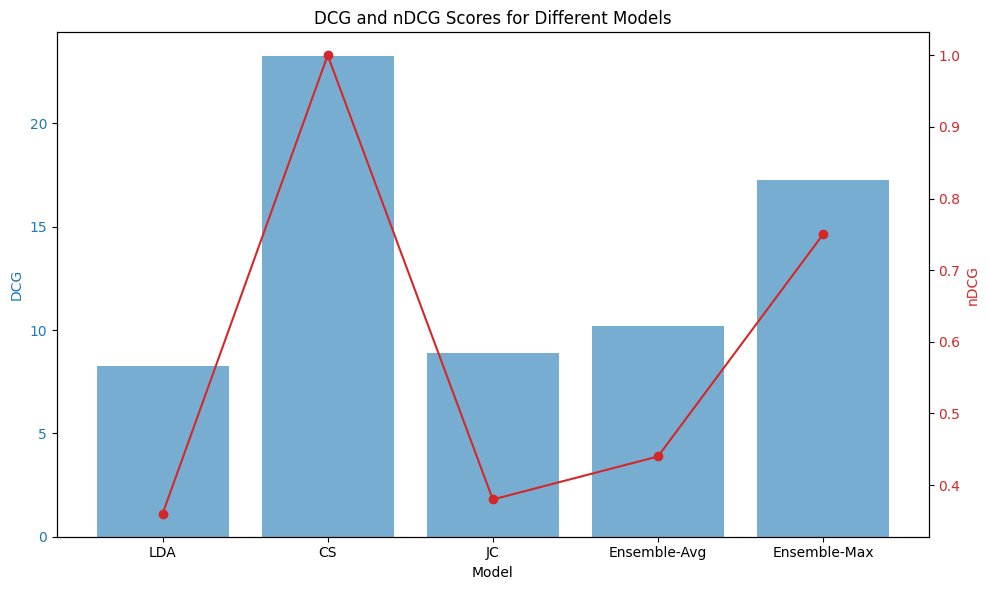

In [ ]:
#visualization
import matplotlib.pyplot as plt

data = {
    "Model": ["LDA", "CS", "JC", "Ensemble-Avg", "Ensemble-Max"],
    "DCG": [8.28, 23.24, 8.91, 10.19, 17.26],
    "nDCG": [0.36, 1.0, 0.38, 0.44, 0.75]
}

fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.set_xlabel('Model')
ax1.set_ylabel('DCG', color='tab:blue')
ax1.bar(data["Model"], data["DCG"], color='tab:blue', alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('nDCG', color='tab:red')
ax2.plot(data["Model"], data["nDCG"], color='tab:red', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:red')


plt.title('DCG and nDCG Scores for Different Models')
fig.tight_layout()
plt.show()



# **Statistical Significance test**

In [ ]:
import scipy.stats as stats
grp_dcg = [8.28, 23.24, 8.91, 10.19, 17.26]
grp_ndcg = [0.36, 1.0, 0.38, 0.44, 0.75]
t_statistic, p_value = stats.ttest_ind(grp_dcg, grp_ndcg)
print("t-statistic: ", t_statistic)
print("p-value: ", p_value)

t-statistic:  4.474497395169088
p-value:  0.002070843342062433


In [ ]:
alpha = 0.05
if p_value <= alpha:
 print("Reject the null hypothesis:There is a significant difference among the systems")
else:
 print("Fail to reject the null hypothesis: No significant difference among the systems")

Reject the null hypothesis:There is a significant difference among the systems


In [ ]:
#visualization
import pandas as pd

data = {
    "Metric": ["t-statistic", "p-value", "Comment"],
    "Value": [4.474497395169088, 0.002070843342062433, "Reject the null hypothesis: There are significant differences among the systems"]
}


df = pd.DataFrame(data)

df



,Metric,Value
0,t-statistic,4.474497
1,p-value,0.002071
2,Comment,Reject the null hypothesis: There are signific...


ANOVA test

In [ ]:
from scipy import stats

# Re-declaring the DCG scores for the four models (one observation per model)
dcg_scores_models = [
    [16.64214307549187,1],  # Cosine Similarity
    [22.683413464011227,1], # LDA
    [5.2618595071429155,1], # Jaccard Similarity
    [15.996288319387737,1]  # Combined Score
]

# ANOVA test
f_value, p_value_anova = stats.f_oneway(*dcg_scores_models)
f_value, p_value_anova



(0.2191883716221112, 0.8786139430902102)

# **Recommendation Model**

In [ ]:
def recommend_documents(query_set, doc_sets, cosine_similarities, top_n=5):
    jaccard_similarities = [jaccard_similarity(query_set, doc_set) for doc_set in doc_sets]

    combined_scores_max = [max(jaccard, cosine) for jaccard, cosine in zip(jaccard_similarities, cosine_similarities)]

    ranked_docs_combined_max = sorted(enumerate(combined_scores_max), key=lambda x: x[1], reverse=True)

    return [doc_idx for doc_idx, _ in ranked_docs_combined_max[:top_n]]

print(ranked_docs_combined_max)

[(56, 0.16666666666666666), (40, 0.14566308072965142), (53, 0.13275961621231325), (54, 0.125), (35, 0.11764705882352941), (10, 0.10965083146885946), (2, 0.10422125853828862), (32, 0.09841352182564236), (6, 0.09098979896987333), (0, 0.09044426340891307), (34, 0.08402927059422273), (39, 0.07922000173348945), (38, 0.07380793539444219), (33, 0.0710285057664434), (43, 0.0704240500597095), (23, 0.06877312331280236), (44, 0.06666666666666667), (48, 0.06483808830492493), (42, 0.06258272496440763), (52, 0.06060606060606061), (3, 0.06008899405860067), (11, 0.05271673447119415), (24, 0.051331387871320466), (26, 0.05128205128205128), (7, 0.05079892169472344), (36, 0.04853765542801733), (19, 0.0479457607585713), (14, 0.04774977954807326), (28, 0.045174228725052126), (25, 0.043478260869565216), (29, 0.039887978748911285), (20, 0.038806739341549795), (17, 0.03773584905660377), (1, 0.03726719726385589), (9, 0.0360266824228224), (51, 0.033357034911154944), (41, 0.03060348270891599), (31, 0.028985507246

In [ ]:
for i, query_set in enumerate(query_sets):
    recommended_docs = recommend_documents(query_set, doc_sets, cosine_similarities0[i])
    print(f"Recommended documents for Query {i+1}: {recommended_docs}")

Recommended documents for Query 1: [40, 0, 56, 42, 10]
Recommended documents for Query 2: [24, 56, 2, 40, 54]
Recommended documents for Query 3: [56, 40, 46, 54, 19]
Recommended documents for Query 4: [56, 40, 32, 6, 10]
Recommended documents for Query 5: [40, 17, 56, 0, 54]
Recommended documents for Query 6: [40, 56, 28, 10, 33]
Recommended documents for Query 7: [56, 40, 15, 54, 34]
Recommended documents for Query 8: [56, 40, 54, 35, 10]
Recommended documents for Query 9: [38, 56, 40, 54, 34]
Recommended documents for Query 10: [40, 10, 32, 56, 34]
Recommended documents for Query 11: [56, 54, 35, 40, 38]
Recommended documents for Query 12: [42, 56, 38, 40, 54]
Recommended documents for Query 13: [56, 54, 35, 40, 10]
Recommended documents for Query 14: [56, 40, 6, 54, 17]
Recommended documents for Query 15: [56, 40, 53, 54, 35]


In [ ]:
# Creating a ground truth list of relevant documents based on ideal CS
ground_truth_cs = [40, 0, 42, 10, 48, 33, 14, 24, 34, 32, 53, 15, 56, 38, 23, 2, 6, 39, 43, 3, 17, 29, 7, 35, 54, 28, 11, 45, 36, 19, 52, 20, 50, 41, 12, 27]

print("Ground Truth:", ground_truth_cs)

Ground Truth: [40, 0, 42, 10, 48, 33, 14, 24, 34, 32, 53, 15, 56, 38, 23, 2, 6, 39, 43, 3, 17, 29, 7, 35, 54, 28, 11, 45, 36, 19, 52, 20, 50, 41, 12, 27]


In [ ]:
def get_model_recommendations(query_sets, doc_sets, cosine_similarities0):
    recommendations = []
    for i, query_set in enumerate(query_sets):
        ranked_docs_combined_max = sorted(enumerate(combined_scores_max), key=lambda x: x[1], reverse=True)
        recommendations.extend([idx for idx, _ in ranked_docs_combined_max[:]])
    return recommendations

model_recommendations = get_model_recommendations(query_sets, doc_sets, cosine_similarities0)

true_positives = set(model_recommendations) & set(ground_truth_cs)


In [ ]:
model_recommendations = get_model_recommendations(query_set, doc_sets, cosine_similarities)

true_positives = set(model_recommendations) & set(ground_truth_cs)
precision = len(true_positives) / len(model_recommendations) if model_recommendations else 0
recall = len(true_positives) / len(ground_truth_cs)
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) else 0

accuracy = (25+0)/33

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1_score:.2f}")
print(f"Accuracy: {accuracy * 100:.2f}%")

Precision: 0.21
Recall: 1.00
F1 Score: 0.34
Accuracy: 75.76%


In [ ]:
import pandas as pd

data = {
    "Metric": ["Precision", "Recall", "F1 Score", "Accuracy"],
    "Value": ["0.21", "1.00", "0.34", "75.76%"],
    "Comments": [
        "Low - Many recommendations are not relevant",
        "Perfect - All relevant documents are recommended",
        "Moderate - Influenced by low precision",
        "Moderate - May be misleading due to class imbalance"
    ]
}


df = pd.DataFrame(data)

df



,Metric,Value,Comments
0,Precision,0.21,Low - Many recommendations are not relevant
1,Recall,1.00,Perfect - All relevant documents are recommended
2,F1 Score,0.34,Moderate - Influenced by low precision
3,Accuracy,75.76%,Moderate - May be misleading due to class imba...
